<span style="color:red; font-family:Helvetica Neue, Helvetica, Arial, sans-serif; font-size:2em;">An Exception was encountered at '<a href="#papermill-error-cell">In [25]</a>'.</span>

# Image Captioning on the Flicker8k Dataset

This notebook provides you with a rough structure for the Mini-Challenge on the topic of Image Captioning from the Deep Learning MSE course. Please make sure to follow the Project Setup steps to ensure reproducable results. Additionally familiarize yourself with the grading structure and project submission guidelines in the _DL-MPW-ImgCaptioning.pdf_ document. There you'll find all the information you should need. 

If you have any questions please contact roman.studer@fhnw.ch

###  Team Name and Members
<span style="color: red;"><strong>TODO:</strong> Add your teamname and add the names of your team members</span>


### Some Guidelines

- You are allowed to use generative models (e.g. ChatGPT, Claude etc.) for code completion or suggestions. However, we require you to perfectly understand and control the code. 
- You are **not** allowed to use the same or similar generative models for providing reflection on the achieved results. __You__ must reflect about what you see and build your own opinion about it.
- You are allowed to create additional python scripts to outsource code snippets to improve readability.

## Project Setup


### 1. Create the virtual environment

Create a new environment and install the necessary dependencies listed in `requirements.txt`. Make sure you can import the libraries in the code cell below and that yout pytorch installation can run on your GPU.

In [1]:
# [batch] package install skipped (prepared on login node)


In [2]:
!nvidia-smi

Mon Jun  1 15:43:24 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.126.20             Driver Version: 580.126.20     CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-40GB          On  |   00000000:90:00.0 Off |                    0 |
| N/A   35C    P0             61W /  400W |       0MiB /  40960MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [3]:
# imports
import textwrap
import math
import copy
from pathlib import Path
from collections import defaultdict
import kagglehub
import shutil
import os

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
from torchvision import transforms
from nltk.translate.bleu_score import corpus_bleu, SmoothingFunction

from dataloader import (
    build_tokenizer_from_split,
    create_caption_dataloader,
    build_captions_map,
    load_split_dataframe,
    load_split_image_ids,
)
from tokenizer import tokenize, CaptionTokenizer

print("torch version:", torch.__version__)
print("torchvision version:", torchvision.__version__)

torch version: 2.12.0+cu130
torchvision version: 0.27.0+cu130


### 2. Download the dataset
The Flickr8k dataset used in this challenge is available under [Flickr 8k Dataset - Kaggle](https://www.kaggle.com/datasets/adityajn105/flickr8k). In the zip folder on Moodle you find the basic structure with `captions.txt` and the `data/splits`-folder, but without images in the `data/images`-folder. Make sure to download all the images and placing them in the folder `data/images/`. 
The train test split is already provided for you and handled by the provided `dataloader.py` script. Test and train split image lists and corresponding captions are located in the `data/splits/` folder. Don't modify this split.

<img src="data_structure.png"/>

In [4]:
# [batch] dataset assumed pre-staged in ./data - download skipped
import os
target_dir = os.path.join(os.getcwd(), 'data')
print('[batch] using dataset at', target_dir)


[batch] using dataset at /cluster/home/magilolg/neural-image-captioning-main/captioning_starter/data


## Dataloader, Tokenizer

The repository includes a `Dataset`-class (`Flickr8kCaptionsDatasetBase`) and `DataLoader`'s that are based on this specific structure of the data directory. You can use `create_caption_dataloader` for obtaining instances for the train and test data loaders. You can configure it with the `tokenizer` provided in the repo. The `tokenizer` performs some preprocessing steps of the captions. It also creates a vocabulary from the training data and then provides a mapping from the words to tokens. Note that there are also some special tokens introduced that are important when processing the captions during training or generating the captions during inference:
| Word    | ID | Role |
| --------| ---|----- |
| `<pad>`  | 0 | padding for filling up sequence to a given length in a mini-batch. | 
| `<bos>`  | 1 | beginning of sentence - each tokenized sentence should start with `<bos>`, i.e. also the generated ones. | 
| `<eos>`  | 2 | end of sentence - for fixed length captions will signal that the rest will consist of `<pad>`-tokens only. | 
| `<unk>`  | 3 | unknown - not available in vocabulary | 

Furthermore, specify your transforms used for preprocessing and augmenting the images and pass them to the `create_caption_dataloader`-method.
The mini-batches created by the dataloader have the following structure: `(images, captions, lengths, image_ids, raw_captions)`. Captions are built from the training vocabulary only, and `lengths` may let you mask padding tokens in the loss.


In [5]:
# Transforms
IMAGENET_SIZE = 224
IMAGENET_MEAN = (0.485, 0.456, 0.406)
IMAGENET_STD  = (0.229, 0.224, 0.225)

def _convert_to_rgb(image: Image.Image) -> Image.Image:
    return image.convert("RGB")

def build_train_transforms() -> transforms.Compose:
    """Training transforms with data augmentation for regularisation."""
    return transforms.Compose([
        transforms.Lambda(_convert_to_rgb),
        # Data augmentation: helps generalisation on small dataset
        transforms.RandomResizedCrop(IMAGENET_SIZE, scale=(0.65, 1.0), ratio=(0.75, 1.33)),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1),
        transforms.RandomGrayscale(p=0.05),
        transforms.ToTensor(),
        transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
    ])

def build_test_transforms() -> transforms.Compose:
    """Deterministic test transforms — no augmentation."""
    return transforms.Compose([
        transforms.Lambda(_convert_to_rgb),
        transforms.Resize(256),
        transforms.CenterCrop(IMAGENET_SIZE),
        transforms.ToTensor(),
        transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
    ])

def denormalize_image(image: torch.Tensor) -> torch.Tensor:
    """Undo ImageNet normalisation for visualisation."""
    mean_t = image.new_tensor(IMAGENET_MEAN).view(-1, 1, 1)
    std_t  = image.new_tensor(IMAGENET_STD).view(-1, 1, 1)
    return (image * std_t + mean_t).clamp(0, 1)

In [6]:
# TODO: ADJUST PATH TO data_dir IF NEEDED
data_dir = target_dir

import os
MIN_WORD_FREQ = 5
MAX_LEN       = 40
BATCH_SIZE    = 512                                    # L40S has 46GB — plenty of room
NUM_WORKERS   = min(8, (os.cpu_count() or 4))           # parallel data loading


In [7]:
# Build vocabulary from training captions only (no test leakage).
tokenizer = build_tokenizer_from_split(split="train", data_dir=data_dir, min_freq=MIN_WORD_FREQ)

# create_caption_dataloader (from dataloader.py) accepts num_workers and
# pin_memory; it sets persistent_workers=True internally when num_workers > 0
# and uses PyTorch's default prefetch_factor.
train_loader = create_caption_dataloader(
    split="train",
    data_dir=data_dir,
    tokenizer=tokenizer,
    transform=build_train_transforms(),
    batch_size=BATCH_SIZE,
    max_len=MAX_LEN,
    caption_sampling="all",
    num_workers=NUM_WORKERS,
    pin_memory=True,
)
test_loader = create_caption_dataloader(
    split="test",
    data_dir=data_dir,
    tokenizer=tokenizer,
    transform=build_test_transforms(),
    batch_size=BATCH_SIZE,
    max_len=MAX_LEN,
    caption_sampling="random",
    num_workers=NUM_WORKERS,
    pin_memory=True,
)

# Build reference captions map for BLEU evaluation
test_captions_df  = load_split_dataframe("test", data_dir)
test_captions_map = build_captions_map(test_captions_df)

images, captions, lengths, image_ids, raw_captions = next(iter(train_loader))

print(f"Vocabulary size:                {len(tokenizer):,}")
print(f"Number of training examples:    {len(train_loader.dataset):,}")
print(f"Batch image tensor shape:       {tuple(images.shape)}")
print(f"Batch caption tensor shape:     {tuple(captions.shape)}")
print(f"Caption lengths in first batch: {lengths.tolist()[:6]} ...")
print(f"DataLoader workers:             {train_loader.num_workers}")
print(f"DataLoader pin_memory:          {train_loader.pin_memory}")
print(f"DataLoader persistent_workers:  {train_loader.persistent_workers}")

images, captions, lengths, image_ids, raw_captions = next(iter(test_loader))
print(f"Number of test examples:        {len(test_loader.dataset):,}")
print(f"Batch image tensor shape:       {tuple(images.shape)}")


Vocabulary size:                2,649
Number of training examples:    32,365
Batch image tensor shape:       (512, 3, 224, 224)
Batch caption tensor shape:     (512, 40)
Caption lengths in first batch: [20, 13, 15, 11, 18, 24] ...
DataLoader workers:             8
DataLoader pin_memory:          True
DataLoader persistent_workers:  True


Number of test examples:        1,618
Batch image tensor shape:       (512, 3, 224, 224)


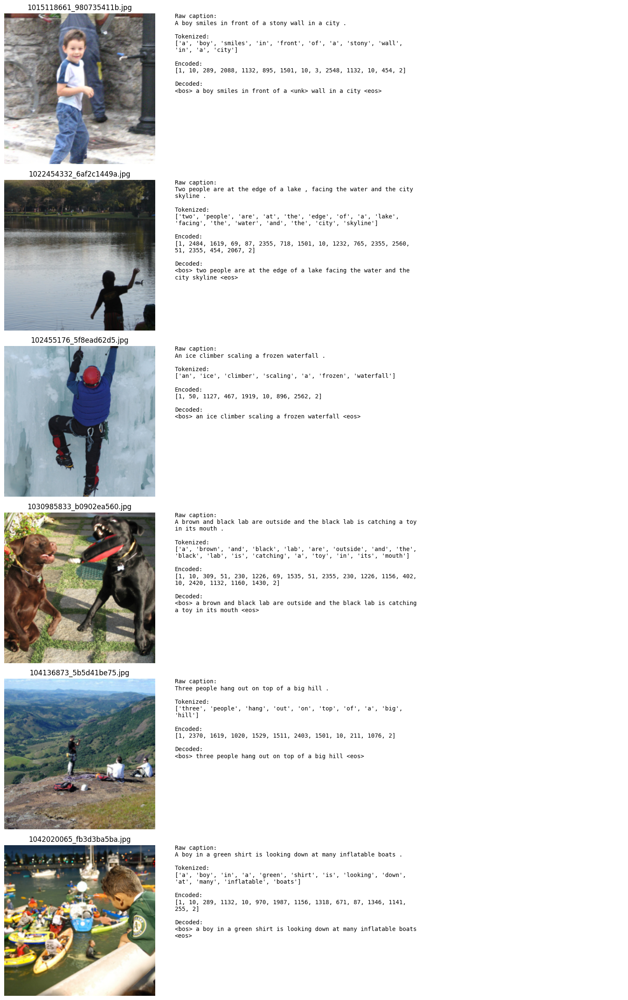

In [8]:
# Visualise a few samples from the test loader
num_examples = 6
n = min(num_examples, len(images))

fig, axes = plt.subplots(
    nrows=n,
    ncols=2,
    figsize=(16, 4 * n),
    gridspec_kw={"width_ratios": [1.1, 2.2]},
)

if n == 1:
    axes = [axes]

for idx in range(n):
    image = denormalize_image(images[idx].detach().cpu()).permute(1, 2, 0)

    encoded_caption  = captions[idx, : int(lengths[idx])].tolist()
    tokenized_caption = tokenize(raw_captions[idx])
    decoded_caption   = tokenizer.decode(encoded_caption, skip_special_tokens=False)

    ax_image, ax_text = axes[idx]
    ax_image.imshow(image)
    ax_image.set_title(image_ids[idx])
    ax_image.axis("off")

    caption_details = "\n\n".join([
        f"Raw caption:\n{textwrap.fill(raw_captions[idx], width=70)}",
        f"Tokenized:\n{textwrap.fill(str(tokenized_caption), width=70)}",
        f"Encoded:\n{textwrap.fill(str(encoded_caption), width=70)}",
        f"Decoded:\n{textwrap.fill(decoded_caption, width=70)}",
    ])

    ax_text.axis("off")
    ax_text.text(0, 1, caption_details, va="top", ha="left", fontsize=10, family="monospace")

plt.tight_layout()
plt.show()

## Shared Utilities

Use this section for shared config and helper functions reused across all experiments. For example define a common training loop, BLEU computation or visualisation helpers here. This way your model models stay directly comparable.


In [9]:
# ── Device ─────────────────────────────────────────────────────────────────
DEVICE = (
    torch.device("cuda") if torch.cuda.is_available()
    else torch.device("mps") if torch.backends.mps.is_available()
    else torch.device("cpu")
)
print("device:", DEVICE)

PAD_IDX = tokenizer.pad_idx  # == 0

import time
from tqdm.auto import tqdm

# Speed knobs --------------------------------------------------------------
# cudnn.benchmark picks the fastest conv algo for our (fixed) input size.
# AMP (mixed precision) gives ~2× speedup on Ada/Ampere/Hopper GPUs.
USE_AMP = (DEVICE.type == "cuda")
if DEVICE.type == "cuda":
    torch.backends.cudnn.benchmark = True
    # bf16 on Ada/Ampere/Hopper avoids the GradScaler overhead; fp16 elsewhere.
    AMP_DTYPE = torch.bfloat16 if torch.cuda.is_bf16_supported() else torch.float16
else:
    AMP_DTYPE = torch.float32
print(f"AMP enabled: {USE_AMP} (dtype={AMP_DTYPE})")

# ── Weights & Biases experiment tracking (opt-in) ──────────────────────────
# Set USE_WANDB = True to log per-epoch metrics to a wandb project.
# Requires `pip install wandb` and a `wandb login` once.
USE_WANDB     = True
WANDB_PROJECT = "flickr8k-captioning"
WANDB_ENTITY  = "zhaw-deep-learning"   # your wandb username/team, or None for default

try:
    import wandb
    _WANDB_AVAILABLE = True
except ImportError:
    _WANDB_AVAILABLE = False
    if USE_WANDB:
        print("⚠ USE_WANDB=True but `wandb` is not installed. "
              "Run `pip install wandb` and `wandb login` to enable, "
              "or set USE_WANDB=False. Logging disabled for now.")
        USE_WANDB = False


# ── Loss helper ─────────────────────────────────────────────────────────────
def masked_cross_entropy(logits: torch.Tensor, targets: torch.Tensor, pad_idx: int = 0) -> torch.Tensor:
    """Average cross-entropy over non-padding positions."""
    B, T, V = logits.shape
    return F.cross_entropy(logits.reshape(-1, V), targets.reshape(-1), ignore_index=pad_idx)


# ── Training loop (mixed precision) ────────────────────────────────────────
def train_one_epoch(encoder, decoder, dataloader, optimizer, device,
                    pad_idx=0, epoch=None, n_epochs=None, model_name="model",
                    scaler=None):
    """One epoch of training with AMP, per-batch progress, grad-norm, timing."""
    encoder.train(); decoder.train()
    total_loss, total_tokens_correct, total_tokens = 0.0, 0, 0
    grad_norms = []
    t0 = time.time()

    pbar = tqdm(
        dataloader,
        desc=f"[{model_name}] Epoch {epoch}/{n_epochs}",
        leave=False, dynamic_ncols=True,
    )

    use_scaler = (scaler is not None) and (AMP_DTYPE == torch.float16)

    for step, (images, captions, lengths, _, _) in enumerate(pbar, start=1):
        images   = images.to(device, non_blocking=True)
        captions = captions.to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)

        if USE_AMP:
            with torch.autocast(device_type=device.type, dtype=AMP_DTYPE):
                features = encoder(images)
                logits   = decoder(features, captions)           # (B, T-1, V)
                targets  = captions[:, 1:]
                loss     = masked_cross_entropy(logits, targets, pad_idx)
        else:
            features = encoder(images)
            logits   = decoder(features, captions)
            targets  = captions[:, 1:]
            loss     = masked_cross_entropy(logits, targets, pad_idx)

        # Backward + clip + step
        if use_scaler:
            scaler.scale(loss).backward()
            scaler.unscale_(optimizer)
            gnorm = nn.utils.clip_grad_norm_(
                list(encoder.parameters()) + list(decoder.parameters()), max_norm=5.0
            )
            scaler.step(optimizer)
            scaler.update()
        else:
            loss.backward()
            gnorm = nn.utils.clip_grad_norm_(
                list(encoder.parameters()) + list(decoder.parameters()), max_norm=5.0
            )
            optimizer.step()

        with torch.no_grad():
            preds = logits.argmax(-1)
            mask  = (targets != pad_idx)
            total_tokens_correct += (preds.eq(targets) & mask).sum().item()
            total_tokens         += mask.sum().item()

        total_loss += loss.item()
        grad_norms.append(float(gnorm))

        running_loss = total_loss / step
        running_acc  = total_tokens_correct / max(total_tokens, 1)
        pbar.set_postfix(
            loss=f"{loss.item():.3f}",
            avg=f"{running_loss:.3f}",
            acc=f"{running_acc:.2%}",
            gnorm=f"{float(gnorm):.2f}",
            lr=f"{optimizer.param_groups[0]['lr']:.2e}",
        )

    dt = time.time() - t0
    return {
        "loss":      total_loss / max(len(dataloader), 1),
        "acc":       total_tokens_correct / max(total_tokens, 1),
        "grad_mean": float(np.mean(grad_norms)) if grad_norms else 0.0,
        "grad_max":  float(np.max(grad_norms)) if grad_norms else 0.0,
        "time_s":    dt,
    }


# ── Validation (AMP) — loss + perplexity + token-acc in one pass ───────────
@torch.no_grad()
def evaluate_loss(encoder, decoder, dataloader, device, pad_idx=0):
    """Returns (mean per-batch loss, perplexity, teacher-forced token accuracy)."""
    encoder.eval(); decoder.eval()
    sum_loss_tok, n_tokens = 0.0, 0
    sum_loss_batch, n_batches = 0.0, 0
    correct = 0

    for images, captions, lengths, _, _ in dataloader:
        images   = images.to(device, non_blocking=True)
        captions = captions.to(device, non_blocking=True)

        if USE_AMP:
            with torch.autocast(device_type=device.type, dtype=AMP_DTYPE):
                features = encoder(images)
                logits   = decoder(features, captions)
        else:
            features = encoder(images)
            logits   = decoder(features, captions)

        # cast back to fp32 for stable loss accumulation
        logits  = logits.float()
        targets = captions[:, 1:]

        loss_sum = F.cross_entropy(
            logits.reshape(-1, logits.size(-1)),
            targets.reshape(-1),
            ignore_index=pad_idx, reduction="sum",
        )
        mask = (targets != pad_idx)
        ntok = mask.sum().item()

        sum_loss_tok   += loss_sum.item()
        n_tokens       += ntok
        sum_loss_batch += (loss_sum.item() / max(ntok, 1))
        n_batches      += 1
        correct        += (logits.argmax(-1).eq(targets) & mask).sum().item()

    ppl = math.exp(sum_loss_tok / max(n_tokens, 1))
    return sum_loss_batch / max(n_batches, 1), ppl, correct / max(n_tokens, 1)


# ── Perplexity (kept for backward compatibility) ───────────────────────────
@torch.no_grad()
def compute_perplexity(encoder, decoder, dataloader, device, pad_idx=0) -> float:
    _, ppl, _ = evaluate_loss(encoder, decoder, dataloader, device, pad_idx)
    return ppl


# ── BLEU ────────────────────────────────────────────────────────────────────
@torch.no_grad()
def compute_bleu(encoder, decoder, dataloader, tokenizer, device,
                 captions_map: dict, max_samples: int = 2000) -> dict:
    """Corpus BLEU-1..4 on generated captions vs all reference captions."""
    encoder.eval(); decoder.eval()
    references, hypotheses = [], []
    count = 0
    pbar = tqdm(dataloader, desc="BLEU", leave=False, dynamic_ncols=True)
    for images, captions, lengths, image_ids, raw_caps in pbar:
        if count >= max_samples:
            break
        images = images.to(device, non_blocking=True)
        if USE_AMP:
            with torch.autocast(device_type=device.type, dtype=AMP_DTYPE):
                features  = encoder(images)
                generated = decoder.generate(features, tokenizer, max_len=35)
        else:
            features  = encoder(images)
            generated = decoder.generate(features, tokenizer, max_len=35)
        for i in range(len(image_ids)):
            all_caps = captions_map.get(image_ids[i], [raw_caps[i]])
            references.append([tokenize(c) for c in all_caps])
            hyp_ids = generated[i].cpu().tolist()
            hyp_str = tokenizer.decode(hyp_ids, skip_special_tokens=True, stop_at_eos=True)
            hypotheses.append(tokenize(hyp_str))
        count += len(image_ids)
        pbar.set_postfix(samples=count)

    sf = SmoothingFunction().method1
    return {
        "BLEU-1": corpus_bleu(references, hypotheses, weights=(1,0,0,0), smoothing_function=sf),
        "BLEU-2": corpus_bleu(references, hypotheses, weights=(0.5,0.5,0,0), smoothing_function=sf),
        "BLEU-3": corpus_bleu(references, hypotheses, weights=(1/3,1/3,1/3,0), smoothing_function=sf),
        "BLEU-4": corpus_bleu(references, hypotheses, weights=(0.25,0.25,0.25,0.25), smoothing_function=sf),
    }


# ── Lightweight in-training caption preview ────────────────────────────────
@torch.no_grad()
def _print_sample_captions(encoder, decoder, test_loader, tokenizer, device, n=2):
    encoder.eval(); decoder.eval()
    images, captions, lengths, image_ids, raw_caps = next(iter(test_loader))
    images = images.to(device)
    if USE_AMP:
        with torch.autocast(device_type=device.type, dtype=AMP_DTYPE):
            features  = encoder(images)
            generated = decoder.generate(features, tokenizer, max_len=35)
    else:
        features  = encoder(images)
        generated = decoder.generate(features, tokenizer, max_len=35)
    for i in range(min(n, images.size(0))):
        gen = tokenizer.decode(generated[i].cpu().tolist(),
                               skip_special_tokens=True, stop_at_eos=True)
        print(f"   ✎ ref : {raw_caps[i]}")
        print(f"     gen : {gen}")


# ── Training runner ─────────────────────────────────────────────────────────
def run_training(encoder, decoder, train_loader, test_loader, tokenizer,
                 device, n_epochs=15, lr=4e-4, weight_decay=1e-4,
                 captions_map=None, model_name="model",
                 eval_every=1, bleu_every=0, sample_every=0):
    """
    Full training loop with verbose per-epoch logging, mixed-precision
    training, and optional periodic validation / BLEU / sample previews.

    Returns dict with train_losses (for backward compat), final perplexity,
    final BLEU, and a full `history` dict for plotting.
    """
    enc_params = sum(p.numel() for p in encoder.parameters() if p.requires_grad)
    dec_params = sum(p.numel() for p in decoder.parameters() if p.requires_grad)
    print("=" * 72)
    print(f" Training: {model_name}")
    print("-" * 72)
    print(f" device          : {device}")
    print(f" AMP             : {USE_AMP} ({AMP_DTYPE})")
    print(f" epochs          : {n_epochs}")
    print(f" lr / wd         : {lr:.2e} / {weight_decay:.2e}")
    print(f" train batches   : {len(train_loader)}   (batch_size={train_loader.batch_size})")
    print(f" val batches     : {len(test_loader)}")
    print(f" encoder params  : {enc_params:,} trainable")
    print(f" decoder params  : {dec_params:,} trainable")
    print(f" eval_every      : {eval_every}    bleu_every: {bleu_every}    sample_every: {sample_every}")
    print("=" * 72)

    optimizer = optim.Adam(
        list(encoder.parameters()) + list(decoder.parameters()),
        lr=lr, weight_decay=weight_decay
    )
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=n_epochs, eta_min=lr/10)

    # ── W&B init (no-op if disabled) ──────────────────────────────────────
    wandb_run = None
    if USE_WANDB and _WANDB_AVAILABLE:
        wandb_run = wandb.init(
            project=WANDB_PROJECT, entity=WANDB_ENTITY, name=model_name,
            config={
                "model_name":   model_name,
                "n_epochs":     n_epochs,
                "lr":           lr,
                "weight_decay": weight_decay,
                "batch_size":   train_loader.batch_size,
                "vocab_size":   len(tokenizer),
                "device":       str(device),
                "amp":          USE_AMP,
                "amp_dtype":    str(AMP_DTYPE),
                "encoder_params": enc_params,
                "decoder_params": dec_params,
            },
            reinit=True,
        )

    # GradScaler is only needed for fp16, not bf16 (bf16 has same exponent range as fp32)
    scaler = torch.amp.GradScaler("cuda") if (USE_AMP and AMP_DTYPE == torch.float16) else None

    history = {"train_loss": [], "train_acc": [],
               "val_loss":   [], "val_ppl": [], "val_acc": [],
               "lr": [], "grad_mean": [], "grad_max": [], "epoch_time": []}
    best_val = float("inf")
    t_start = time.time()

    for epoch in range(1, n_epochs + 1):
        cur_lr = optimizer.param_groups[0]["lr"]
        tr = train_one_epoch(encoder, decoder, train_loader, optimizer, device,
                             epoch=epoch, n_epochs=n_epochs, model_name=model_name,
                             scaler=scaler)
        scheduler.step()

        history["train_loss"].append(tr["loss"])
        history["train_acc"].append(tr["acc"])
        history["grad_mean"].append(tr["grad_mean"])
        history["grad_max"].append(tr["grad_max"])
        history["epoch_time"].append(tr["time_s"])
        history["lr"].append(cur_lr)

        line = (f"[{model_name}] Epoch {epoch:02d}/{n_epochs} "
                f"| train_loss={tr['loss']:.4f} acc={tr['acc']:.2%} "
                f"| gnorm μ={tr['grad_mean']:.2f} max={tr['grad_max']:.2f} "
                f"| lr={cur_lr:.2e} | {tr['time_s']:.1f}s")

        if eval_every and (epoch % eval_every == 0):
            v_loss, v_ppl, v_acc = evaluate_loss(encoder, decoder, test_loader, device)
            history["val_loss"].append(v_loss)
            history["val_ppl"].append(v_ppl)
            history["val_acc"].append(v_acc)
            tag = ""
            if v_loss < best_val:
                best_val = v_loss
                tag = "  ← new best"
            line += f" | val_loss={v_loss:.4f} ppl={v_ppl:.2f} acc={v_acc:.2%}{tag}"
        else:
            history["val_loss"].append(None)
            history["val_ppl"].append(None)
            history["val_acc"].append(None)

        print(line)

        # ── W&B per-epoch log ─────────────────────────────────────────────
        if wandb_run is not None:
            log_dict = {
                "epoch":      epoch,
                "train/loss": tr["loss"],
                "train/acc":  tr["acc"],
                "train/grad_mean": tr["grad_mean"],
                "train/grad_max":  tr["grad_max"],
                "train/time_s":    tr["time_s"],
                "lr":         cur_lr,
            }
            if history["val_loss"][-1] is not None:
                log_dict["val/loss"] = history["val_loss"][-1]
                log_dict["val/perplexity"] = history["val_ppl"][-1]
                log_dict["val/acc"]  = history["val_acc"][-1]
            wandb_run.log(log_dict, step=epoch)

        if bleu_every and (epoch % bleu_every == 0) and captions_map is not None:
            bleu_mid = compute_bleu(encoder, decoder, test_loader, tokenizer,
                                    device, captions_map, max_samples=500)
            print(f"   ↳ BLEU @ epoch {epoch}:  "
                  + "  ".join(f"{k}={v:.3f}" for k, v in bleu_mid.items()))

        if sample_every and (epoch % sample_every == 0):
            _print_sample_captions(encoder, decoder, test_loader, tokenizer, device, n=2)

    total_time = time.time() - t_start
    print("-" * 72)
    print(f" Training finished in {total_time/60:.1f} min "
          f"({total_time/n_epochs:.1f}s/epoch on average)")

    ppl  = compute_perplexity(encoder, decoder, test_loader, device)
    bleu = compute_bleu(encoder, decoder, test_loader, tokenizer, device, captions_map)
    print(f"\n[{model_name}] Final Perplexity: {ppl:.2f}")
    for k, v in bleu.items():
        print(f"   {k}: {v:.4f}")
    print("=" * 72)

    # ── W&B final summary + close run ─────────────────────────────────────
    if wandb_run is not None:
        wandb_run.summary["final/perplexity"] = ppl
        for k, v in bleu.items():
            wandb_run.summary[f"final/{k}"] = v
        wandb_run.summary["total_time_min"] = total_time / 60
        wandb_run.finish()

    return {
        "train_losses": history["train_loss"],
        "perplexity":   ppl,
        "bleu":         bleu,
        "history":      history,
    }


# ── Sample caption display ──────────────────────────────────────────────────
@torch.no_grad()
def show_sample_captions(encoder, decoder, test_loader, tokenizer, device, n=6, title=""):
    """Show n images with their generated and reference captions."""
    encoder.eval(); decoder.eval()
    images, captions, lengths, image_ids, raw_captions = next(iter(test_loader))
    images_dev = images.to(device)
    if USE_AMP:
        with torch.autocast(device_type=device.type, dtype=AMP_DTYPE):
            features  = encoder(images_dev)
            generated = decoder.generate(features, tokenizer, max_len=35)
    else:
        features  = encoder(images_dev)
        generated = decoder.generate(features, tokenizer, max_len=35)

    n = min(n, images.size(0))
    fig, axes = plt.subplots(n, 1, figsize=(11, 3.5 * n))
    if n == 1:
        axes = [axes]
    fig.suptitle(title, fontsize=13, weight="bold")
    for i in range(n):
        img = denormalize_image(images[i].cpu()).permute(1, 2, 0).numpy()
        gen_ids = generated[i].cpu().tolist()
        gen_cap = tokenizer.decode(gen_ids, skip_special_tokens=True, stop_at_eos=True)
        axes[i].imshow(img)
        axes[i].set_title(
            f"Generated : {gen_cap}\nReference : {raw_captions[i]}", fontsize=9, loc="left"
        )
        axes[i].axis("off")
    plt.tight_layout()
    plt.show()


# ── Training curve plotter ───────────────────────────────────────────────────
def plot_training_curves(losses_dict: dict, title: str = "Training Loss"):
    fig, ax = plt.subplots(figsize=(9, 4))
    for name, losses in losses_dict.items():
        ax.plot(losses, label=name, linewidth=2)
    ax.set_xlabel("Epoch"); ax.set_ylabel("Cross-Entropy Loss")
    ax.set_title(title); ax.legend(); ax.grid(alpha=0.3)
    plt.tight_layout(); plt.show()


# ── Verbose history plotter (train+val loss, ppl, grad-norm, lr) ────────────
def plot_history(history: dict, model_name: str = "model"):
    """Plot detailed per-epoch diagnostics from a run_training() history dict."""
    epochs = range(1, len(history["train_loss"]) + 1)
    has_val = any(v is not None for v in history["val_loss"])

    fig, axes = plt.subplots(2, 2, figsize=(12, 7))
    fig.suptitle(f"Training diagnostics — {model_name}", fontsize=13, weight="bold")

    ax = axes[0, 0]
    ax.plot(epochs, history["train_loss"], label="train", linewidth=2)
    if has_val:
        val = [v if v is not None else float("nan") for v in history["val_loss"]]
        ax.plot(epochs, val, label="val", linewidth=2)
    ax.set_title("Loss"); ax.set_xlabel("epoch"); ax.set_ylabel("CE loss")
    ax.legend(); ax.grid(alpha=0.3)

    ax = axes[0, 1]
    if has_val:
        ppl = [v if v is not None else float("nan") for v in history["val_ppl"]]
        ax.plot(epochs, ppl, linewidth=2, color="C2")
        ax.set_title("Validation perplexity")
    else:
        ax.set_title("Validation perplexity (not tracked)")
    ax.set_xlabel("epoch"); ax.set_ylabel("perplexity"); ax.grid(alpha=0.3)

    ax = axes[1, 0]
    ax.plot(epochs, history["grad_mean"], label="mean", linewidth=2)
    ax.plot(epochs, history["grad_max"],  label="max",  linewidth=2, alpha=0.6)
    ax.set_title("Gradient norm (pre-clip)"); ax.set_xlabel("epoch"); ax.set_ylabel("‖g‖")
    ax.legend(); ax.grid(alpha=0.3)

    ax = axes[1, 1]
    ax.plot(epochs, history["lr"], linewidth=2, color="C3")
    ax.set_title("Learning rate"); ax.set_xlabel("epoch"); ax.set_ylabel("lr")
    ax.grid(alpha=0.3)

    plt.tight_layout(); plt.show()


device: cuda
AMP enabled: True (dtype=torch.bfloat16)
⚠ USE_WANDB=True but `wandb` is not installed. Run `pip install wandb` and `wandb login` to enable, or set USE_WANDB=False. Logging disabled for now.


## Model 1 - Show and Tell

Implement the model described in the [_Show and Tell_](https://arxiv.org/abs/1411.4555) paper. Record the training behaviour, inspect a few generated captions on held-out images, and report BLEU on the fixed evaluation subset.

**Architecture:**
- ResNet-18 CNN encoder (pretrained, final FC removed → global average pool → linear projection)
- LSTM decoder with teacher forcing during training and greedy decoding at inference


In [10]:
# Hyperparameters for Show and Tell
SAT_ENCODER_DIM  = 512   # output dim of the encoder projection
SAT_EMBED_DIM    = 256   # word embedding size
SAT_DECODER_DIM  = 512   # LSTM hidden size
SAT_DROPOUT      = 0.1
SAT_FREEZE_ENC   = True  # set True to only fine-tune the decoder initially
SAT_LR           = 5e-4
SAT_N_EPOCHS     = 50
SAT_WEIGHT_DECAY = 1e-5

In [11]:
import torch.nn as nn
import torchvision.models as tvm


# ── Encoder (Show and Tell) ──────────────────────────────────────────────────
class ShowAndTellEncoder(nn.Module):
    """
    ResNet-18 with the classification head replaced by a linear projection.
    Outputs a single global feature vector per image: (B, encoder_dim).
    """
    def __init__(self, encoder_dim: int = 512, freeze: bool = False):
        super().__init__()
        backbone = tvm.resnet18(weights=tvm.ResNet18_Weights.DEFAULT)
        # Keep everything up to (and including) the adaptive avg pool
        self.cnn = nn.Sequential(*list(backbone.children())[:-1])  # → (B, 512, 1, 1)
        self.project = nn.Linear(512, encoder_dim)
        self.bn      = nn.BatchNorm1d(encoder_dim)
        if freeze:
            for p in self.cnn.parameters():
                p.requires_grad = False

    def forward(self, images: torch.Tensor) -> torch.Tensor:
        feat = self.cnn(images).flatten(1)   # (B, 512)
        return self.bn(self.project(feat))   # (B, encoder_dim)


# ── Decoder (Show and Tell) ──────────────────────────────────────────────────
class ShowAndTellDecoder(nn.Module):
    """
    LSTM-based caption decoder.
      forward()  — teacher-forced training pass, returns logits (B, T-1, V)
      generate() — greedy inference, returns token ids  (B, max_len)
    """
    def __init__(self, vocab_size: int, encoder_dim: int, embed_dim: int,
                 decoder_dim: int, dropout: float = 0.5, pad_idx: int = 0):
        super().__init__()
        self.pad_idx = pad_idx
        self.embed   = nn.Embedding(vocab_size, embed_dim, padding_idx=pad_idx)
        self.init_h  = nn.Linear(encoder_dim, decoder_dim)
        self.init_c  = nn.Linear(encoder_dim, decoder_dim)
        self.lstm    = nn.LSTMCell(embed_dim, decoder_dim)
        self.drop    = nn.Dropout(dropout)
        self.fc      = nn.Linear(decoder_dim, vocab_size)

    def _init_hidden(self, img_feat: torch.Tensor):
        h = torch.tanh(self.init_h(img_feat))
        c = torch.tanh(self.init_c(img_feat))
        return h, c

    def forward(self, img_feat: torch.Tensor, captions: torch.Tensor) -> torch.Tensor:
        """
        Teacher-forced forward pass.
        img_feat : (B, encoder_dim)
        captions : (B, max_len)  — token ids incl. <bos> … <eos> <pad>…
        Returns logits (B, T-1, vocab_size).
        """
        h, c = self._init_hidden(img_feat)
        embeds = self.drop(self.embed(captions[:, :-1]))  # (B, T-1, E)
        logits = []
        for t in range(embeds.size(1)):
            h, c = self.lstm(embeds[:, t], (h, c))
            logits.append(self.fc(self.drop(h)))
        return torch.stack(logits, dim=1)  # (B, T-1, V)

    @torch.no_grad()
    def generate(self, img_feat: torch.Tensor, tokenizer, max_len: int = 35) -> torch.Tensor:
        """
        Greedy decoding.
        Returns (B, max_len) token ids (not including <bos>).
        """
        self.eval()
        B, device = img_feat.size(0), img_feat.device
        h, c = self._init_hidden(img_feat)
        tok  = torch.full((B,), tokenizer.bos_idx, dtype=torch.long, device=device)
        out  = []
        for _ in range(max_len):
            emb   = self.embed(tok)
            h, c  = self.lstm(emb, (h, c))
            pred  = self.fc(h).argmax(-1)
            out.append(pred)
            tok = pred
        return torch.stack(out, dim=1)  # (B, max_len)


print("ShowAndTellEncoder and ShowAndTellDecoder defined.")

ShowAndTellEncoder and ShowAndTellDecoder defined.


In [12]:
# Instantiate Model 1
sat_encoder = ShowAndTellEncoder(encoder_dim=SAT_ENCODER_DIM, freeze=SAT_FREEZE_ENC).to(DEVICE)
sat_decoder = ShowAndTellDecoder(
    vocab_size=len(tokenizer),
    encoder_dim=SAT_ENCODER_DIM,
    embed_dim=SAT_EMBED_DIM,
    decoder_dim=SAT_DECODER_DIM,
    dropout=SAT_DROPOUT,
    pad_idx=PAD_IDX,
).to(DEVICE)

total_params = sum(p.numel() for p in list(sat_encoder.parameters()) + list(sat_decoder.parameters()))
print(f"Show and Tell total params: {total_params:,}")

# Train
sat_results = run_training(
    encoder=sat_encoder,
    decoder=sat_decoder,
    train_loader=train_loader,
    test_loader=test_loader,
    tokenizer=tokenizer,
    device=DEVICE,
    n_epochs=SAT_N_EPOCHS,
    lr=SAT_LR,
    weight_decay=SAT_WEIGHT_DECAY,
    captions_map=test_captions_map,
    model_name="ShowAndTell",
)

Show and Tell total params: 15,579,545
 Training: ShowAndTell
------------------------------------------------------------------------
 device          : cuda
 AMP             : True (torch.bfloat16)
 epochs          : 50
 lr / wd         : 5.00e-04 / 1.00e-05
 train batches   : 64   (batch_size=512)
 val batches     : 4
 encoder params  : 263,680 trainable
 decoder params  : 4,139,353 trainable
 eval_every      : 1    bleu_every: 0    sample_every: 0


[ShowAndTell] Epoch 1/50:   0%|                                                                               …

[ShowAndTell] Epoch 01/50 | train_loss=5.3161 acc=19.29% | gnorm μ=0.59 max=1.51 | lr=5.00e-04 | 72.5s | val_loss=4.3088 ppl=75.36 acc=24.99%  ← new best


[ShowAndTell] Epoch 2/50:   0%|                                                                               …

[ShowAndTell] Epoch 02/50 | train_loss=4.0743 acc=27.83% | gnorm μ=0.24 max=0.46 | lr=5.00e-04 | 71.8s | val_loss=3.8516 ppl=45.21 acc=30.60%  ← new best


[ShowAndTell] Epoch 3/50:   0%|                                                                               …

[ShowAndTell] Epoch 03/50 | train_loss=3.7038 acc=31.15% | gnorm μ=0.24 max=0.45 | lr=4.98e-04 | 70.9s | val_loss=3.5344 ppl=34.11 acc=32.64%  ← new best


[ShowAndTell] Epoch 4/50:   0%|                                                                               …

[ShowAndTell] Epoch 04/50 | train_loss=3.4746 acc=33.07% | gnorm μ=0.24 max=0.45 | lr=4.96e-04 | 70.9s | val_loss=3.4101 ppl=30.26 acc=33.49%  ← new best


[ShowAndTell] Epoch 5/50:   0%|                                                                               …

[ShowAndTell] Epoch 05/50 | train_loss=3.3108 acc=34.62% | gnorm μ=0.24 max=0.49 | lr=4.93e-04 | 71.3s | val_loss=3.2789 ppl=26.18 acc=35.06%  ← new best


[ShowAndTell] Epoch 6/50:   0%|                                                                               …

[ShowAndTell] Epoch 06/50 | train_loss=3.1791 acc=35.88% | gnorm μ=0.25 max=0.48 | lr=4.89e-04 | 70.7s | val_loss=3.1417 ppl=23.18 acc=36.59%  ← new best


[ShowAndTell] Epoch 7/50:   0%|                                                                               …

[ShowAndTell] Epoch 07/50 | train_loss=3.0784 acc=36.86% | gnorm μ=0.26 max=0.56 | lr=4.84e-04 | 73.7s | val_loss=3.0828 ppl=21.64 acc=36.69%  ← new best


[ShowAndTell] Epoch 8/50:   0%|                                                                               …

[ShowAndTell] Epoch 08/50 | train_loss=2.9895 acc=37.68% | gnorm μ=0.26 max=0.53 | lr=4.79e-04 | 70.7s | val_loss=3.0418 ppl=21.02 acc=37.14%  ← new best


[ShowAndTell] Epoch 9/50:   0%|                                                                               …

[ShowAndTell] Epoch 09/50 | train_loss=2.9177 acc=38.39% | gnorm μ=0.28 max=0.59 | lr=4.72e-04 | 69.1s | val_loss=2.9943 ppl=19.83 acc=37.71%  ← new best


[ShowAndTell] Epoch 10/50:   0%|                                                                              …

[ShowAndTell] Epoch 10/50 | train_loss=2.8573 acc=38.97% | gnorm μ=0.28 max=0.56 | lr=4.65e-04 | 70.5s | val_loss=2.9481 ppl=18.83 acc=38.13%  ← new best


[ShowAndTell] Epoch 11/50:   0%|                                                                              …

[ShowAndTell] Epoch 11/50 | train_loss=2.8018 acc=39.60% | gnorm μ=0.28 max=0.58 | lr=4.57e-04 | 75.1s | val_loss=2.9030 ppl=18.09 acc=38.81%  ← new best


[ShowAndTell] Epoch 12/50:   0%|                                                                              …

[ShowAndTell] Epoch 12/50 | train_loss=2.7536 acc=40.16% | gnorm μ=0.29 max=0.55 | lr=4.48e-04 | 71.4s | val_loss=2.9275 ppl=18.31 acc=38.54%


[ShowAndTell] Epoch 13/50:   0%|                                                                              …

[ShowAndTell] Epoch 13/50 | train_loss=2.7093 acc=40.62% | gnorm μ=0.29 max=0.57 | lr=4.39e-04 | 71.0s | val_loss=2.8405 ppl=17.10 acc=39.24%  ← new best


[ShowAndTell] Epoch 14/50:   0%|                                                                              …

[ShowAndTell] Epoch 14/50 | train_loss=2.6708 acc=41.10% | gnorm μ=0.30 max=0.59 | lr=4.29e-04 | 71.0s | val_loss=2.8880 ppl=17.69 acc=38.96%


[ShowAndTell] Epoch 15/50:   0%|                                                                              …

[ShowAndTell] Epoch 15/50 | train_loss=2.6341 acc=41.51% | gnorm μ=0.30 max=0.61 | lr=4.18e-04 | 72.1s | val_loss=2.8565 ppl=17.25 acc=39.16%


[ShowAndTell] Epoch 16/50:   0%|                                                                              …

[ShowAndTell] Epoch 16/50 | train_loss=2.5990 acc=41.97% | gnorm μ=0.31 max=0.63 | lr=4.07e-04 | 71.7s | val_loss=2.8216 ppl=16.54 acc=40.14%  ← new best


[ShowAndTell] Epoch 17/50:   0%|                                                                              …

[ShowAndTell] Epoch 17/50 | train_loss=2.5683 acc=42.33% | gnorm μ=0.31 max=0.64 | lr=3.96e-04 | 70.8s | val_loss=2.8327 ppl=16.84 acc=39.85%


[ShowAndTell] Epoch 18/50:   0%|                                                                              …

[ShowAndTell] Epoch 18/50 | train_loss=2.5397 acc=42.74% | gnorm μ=0.31 max=0.61 | lr=3.83e-04 | 70.8s | val_loss=2.8250 ppl=16.60 acc=39.84%


[ShowAndTell] Epoch 19/50:   0%|                                                                              …

[ShowAndTell] Epoch 19/50 | train_loss=2.5105 acc=43.11% | gnorm μ=0.32 max=0.62 | lr=3.71e-04 | 70.1s | val_loss=2.8294 ppl=16.55 acc=39.44%


[ShowAndTell] Epoch 20/50:   0%|                                                                              …

[ShowAndTell] Epoch 20/50 | train_loss=2.4876 acc=43.36% | gnorm μ=0.33 max=0.67 | lr=3.58e-04 | 71.3s | val_loss=2.8221 ppl=16.57 acc=39.82%


[ShowAndTell] Epoch 21/50:   0%|                                                                              …

[ShowAndTell] Epoch 21/50 | train_loss=2.4610 acc=43.73% | gnorm μ=0.33 max=0.66 | lr=3.45e-04 | 72.6s | val_loss=2.8255 ppl=16.51 acc=39.92%


[ShowAndTell] Epoch 22/50:   0%|                                                                              …

[ShowAndTell] Epoch 22/50 | train_loss=2.4388 acc=44.03% | gnorm μ=0.33 max=0.65 | lr=3.31e-04 | 71.9s | val_loss=2.8159 ppl=16.40 acc=40.02%  ← new best


[ShowAndTell] Epoch 23/50:   0%|                                                                              …

[ShowAndTell] Epoch 23/50 | train_loss=2.4153 acc=44.39% | gnorm μ=0.34 max=0.72 | lr=3.17e-04 | 69.1s | val_loss=2.7729 ppl=15.92 acc=40.37%  ← new best


[ShowAndTell] Epoch 24/50:   0%|                                                                              …

[ShowAndTell] Epoch 24/50 | train_loss=2.3974 acc=44.69% | gnorm μ=0.34 max=0.71 | lr=3.03e-04 | 70.9s | val_loss=2.7546 ppl=15.61 acc=40.36%  ← new best


[ShowAndTell] Epoch 25/50:   0%|                                                                              …

[ShowAndTell] Epoch 25/50 | train_loss=2.3755 acc=44.91% | gnorm μ=0.35 max=0.70 | lr=2.89e-04 | 76.6s | val_loss=2.7859 ppl=15.69 acc=40.52%


[ShowAndTell] Epoch 26/50:   0%|                                                                              …

[ShowAndTell] Epoch 26/50 | train_loss=2.3592 acc=45.20% | gnorm μ=0.35 max=0.75 | lr=2.75e-04 | 72.0s | val_loss=2.7387 ppl=15.43 acc=40.32%  ← new best


[ShowAndTell] Epoch 27/50:   0%|                                                                              …

[ShowAndTell] Epoch 27/50 | train_loss=2.3450 acc=45.44% | gnorm μ=0.36 max=0.77 | lr=2.61e-04 | 70.7s | val_loss=2.7831 ppl=15.75 acc=40.45%


[ShowAndTell] Epoch 28/50:   0%|                                                                              …

[ShowAndTell] Epoch 28/50 | train_loss=2.3250 acc=45.70% | gnorm μ=0.36 max=0.69 | lr=2.47e-04 | 72.7s | val_loss=2.7866 ppl=15.93 acc=40.02%


[ShowAndTell] Epoch 29/50:   0%|                                                                              …

[ShowAndTell] Epoch 29/50 | train_loss=2.3092 acc=45.85% | gnorm μ=0.36 max=0.73 | lr=2.33e-04 | 74.2s | val_loss=2.7551 ppl=15.60 acc=40.78%


[ShowAndTell] Epoch 30/50:   0%|                                                                              …

[ShowAndTell] Epoch 30/50 | train_loss=2.2978 acc=46.05% | gnorm μ=0.37 max=0.80 | lr=2.19e-04 | 72.6s | val_loss=2.7773 ppl=15.22 acc=41.06%


[ShowAndTell] Epoch 31/50:   0%|                                                                              …

[ShowAndTell] Epoch 31/50 | train_loss=2.2847 acc=46.26% | gnorm μ=0.37 max=0.78 | lr=2.05e-04 | 71.2s | val_loss=2.7667 ppl=15.74 acc=40.25%


[ShowAndTell] Epoch 32/50:   0%|                                                                              …

[ShowAndTell] Epoch 32/50 | train_loss=2.2705 acc=46.54% | gnorm μ=0.37 max=0.81 | lr=1.92e-04 | 71.6s | val_loss=2.7460 ppl=15.59 acc=40.33%


[ShowAndTell] Epoch 33/50:   0%|                                                                              …

[ShowAndTell] Epoch 33/50 | train_loss=2.2583 acc=46.70% | gnorm μ=0.37 max=0.75 | lr=1.79e-04 | 72.1s | val_loss=2.7820 ppl=15.65 acc=40.59%


[ShowAndTell] Epoch 34/50:   0%|                                                                              …

[ShowAndTell] Epoch 34/50 | train_loss=2.2491 acc=46.92% | gnorm μ=0.38 max=0.83 | lr=1.67e-04 | 72.7s | val_loss=2.7885 ppl=15.99 acc=40.05%


[ShowAndTell] Epoch 35/50:   0%|                                                                              …

[ShowAndTell] Epoch 35/50 | train_loss=2.2385 acc=47.07% | gnorm μ=0.38 max=0.75 | lr=1.54e-04 | 73.5s | val_loss=2.7708 ppl=15.62 acc=40.41%


[ShowAndTell] Epoch 36/50:   0%|                                                                              …

[ShowAndTell] Epoch 36/50 | train_loss=2.2284 acc=47.17% | gnorm μ=0.38 max=0.77 | lr=1.43e-04 | 70.3s | val_loss=2.7458 ppl=15.68 acc=40.31%


[ShowAndTell] Epoch 37/50:   0%|                                                                              …

[ShowAndTell] Epoch 37/50 | train_loss=2.2199 acc=47.26% | gnorm μ=0.38 max=0.82 | lr=1.32e-04 | 71.4s | val_loss=2.7791 ppl=15.65 acc=40.20%


[ShowAndTell] Epoch 38/50:   0%|                                                                              …

[ShowAndTell] Epoch 38/50 | train_loss=2.2125 acc=47.40% | gnorm μ=0.39 max=0.81 | lr=1.21e-04 | 73.1s | val_loss=2.7440 ppl=15.57 acc=40.17%


[ShowAndTell] Epoch 39/50:   0%|                                                                              …

[ShowAndTell] Epoch 39/50 | train_loss=2.2059 acc=47.51% | gnorm μ=0.39 max=0.80 | lr=1.11e-04 | 72.9s | val_loss=2.7406 ppl=15.46 acc=40.61%


[ShowAndTell] Epoch 40/50:   0%|                                                                              …

[ShowAndTell] Epoch 40/50 | train_loss=2.1973 acc=47.67% | gnorm μ=0.39 max=0.82 | lr=1.02e-04 | 73.5s | val_loss=2.8039 ppl=15.71 acc=40.37%


[ShowAndTell] Epoch 41/50:   0%|                                                                              …

[ShowAndTell] Epoch 41/50 | train_loss=2.1902 acc=47.84% | gnorm μ=0.39 max=0.81 | lr=9.30e-05 | 76.1s | val_loss=2.7510 ppl=15.45 acc=40.87%


[ShowAndTell] Epoch 42/50:   0%|                                                                              …

[ShowAndTell] Epoch 42/50 | train_loss=2.1859 acc=47.85% | gnorm μ=0.39 max=0.85 | lr=8.50e-05 | 72.3s | val_loss=2.7644 ppl=15.72 acc=40.40%


[ShowAndTell] Epoch 43/50:   0%|                                                                              …

[ShowAndTell] Epoch 43/50 | train_loss=2.1799 acc=47.94% | gnorm μ=0.39 max=0.79 | lr=7.78e-05 | 74.0s | val_loss=2.8138 ppl=16.18 acc=40.37%


[ShowAndTell] Epoch 44/50:   0%|                                                                              …

[ShowAndTell] Epoch 44/50 | train_loss=2.1749 acc=48.03% | gnorm μ=0.39 max=0.86 | lr=7.14e-05 | 71.9s | val_loss=2.7691 ppl=15.82 acc=40.35%


[ShowAndTell] Epoch 45/50:   0%|                                                                              …

[ShowAndTell] Epoch 45/50 | train_loss=2.1709 acc=48.06% | gnorm μ=0.40 max=0.85 | lr=6.58e-05 | 73.3s | val_loss=2.7653 ppl=15.86 acc=40.63%


[ShowAndTell] Epoch 46/50:   0%|                                                                              …

[ShowAndTell] Epoch 46/50 | train_loss=2.1680 acc=48.06% | gnorm μ=0.40 max=0.79 | lr=6.10e-05 | 71.2s | val_loss=2.7775 ppl=15.69 acc=40.54%


[ShowAndTell] Epoch 47/50:   0%|                                                                              …

[ShowAndTell] Epoch 47/50 | train_loss=2.1635 acc=48.22% | gnorm μ=0.40 max=0.81 | lr=5.71e-05 | 70.4s | val_loss=2.7587 ppl=15.77 acc=40.41%


[ShowAndTell] Epoch 48/50:   0%|                                                                              …

[ShowAndTell] Epoch 48/50 | train_loss=2.1630 acc=48.30% | gnorm μ=0.40 max=0.88 | lr=5.40e-05 | 70.7s | val_loss=2.7691 ppl=15.72 acc=40.45%


[ShowAndTell] Epoch 49/50:   0%|                                                                              …

[ShowAndTell] Epoch 49/50 | train_loss=2.1576 acc=48.35% | gnorm μ=0.40 max=0.84 | lr=5.18e-05 | 69.7s | val_loss=2.7645 ppl=15.42 acc=40.82%


[ShowAndTell] Epoch 50/50:   0%|                                                                              …

[ShowAndTell] Epoch 50/50 | train_loss=2.1562 acc=48.24% | gnorm μ=0.41 max=0.86 | lr=5.04e-05 | 71.1s | val_loss=2.7854 ppl=15.66 acc=40.80%
------------------------------------------------------------------------
 Training finished in 63.0 min (75.6s/epoch on average)


BLEU:   0%|                                                                                                   …


[ShowAndTell] Final Perplexity: 15.47
   BLEU-1: 0.5732
   BLEU-2: 0.3929
   BLEU-3: 0.2621
   BLEU-4: 0.1746


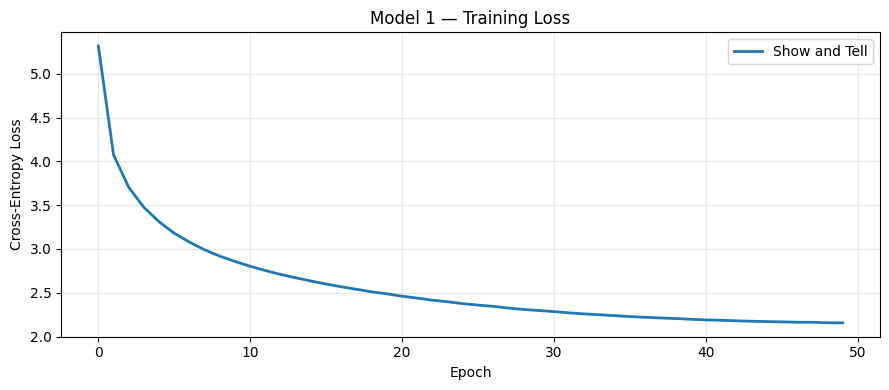

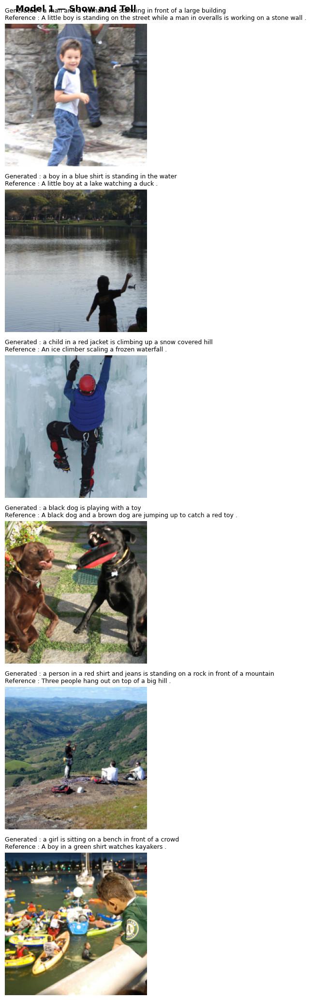

  Perplexity : 15.47
  BLEU-1       : 0.5732
  BLEU-2       : 0.3929
  BLEU-3       : 0.2621
  BLEU-4       : 0.1746


In [13]:
# Training curve
plot_training_curves({"Show and Tell": sat_results["train_losses"]}, title="Model 1 — Training Loss")

# Sample captions
show_sample_captions(sat_encoder, sat_decoder, test_loader, tokenizer, DEVICE, n=6,
                     title="Model 1 — Show and Tell")

# Summary table
print("=" * 45)
print(f"  Perplexity : {sat_results['perplexity']:.2f}")
for k, v in sat_results["bleu"].items():
    print(f"  {k}       : {v:.4f}")
print("=" * 45)

Briefly summarize what happened during training, which captions looked convincing or weak, and what the BLEU score does or does not capture for this model.


<span style="color: red;"><strong>TODO:</strong> Write your reflection on Model 1 here.</span>


## Model 2 - Show, Attend and Tell

Now implement the continuation of the Show and Tell paper. An attention-based captioning model described in the paper [_Show, Attend and Tell_](https://arxiv.org/abs/1502.03044). Use the same test data subset and BLEU setup as before, then compare how attention changes the training behavior and generated captions.

**Architecture:**
- ResNet-18 spatial encoder: retains the 7×7 convolutional feature map → (B, 49, 512)
- Additive (Bahdanau) attention: at each decoding step the LSTM attends over the 49 spatial locations
- LSTMCell decoder with context vector concatenated to the word embedding
- Doubly-stochastic attention gate to encourage each feature location to be attended to


In [14]:
# Hyperparameters for Show, Attend and Tell
SATT_ENCODER_DIM  = 512   # channels in the ResNet-18 spatial feature map
SATT_EMBED_DIM    = 256
SATT_DECODER_DIM  = 512
SATT_ATTENTION_DIM = 256
SATT_DROPOUT       = 0.1
SATT_FREEZE_ENC    = True
SATT_LR            = 5e-4
SATT_N_EPOCHS      = 50
SATT_WEIGHT_DECAY  = 1e-5

In [15]:
# ── Encoder (Show, Attend and Tell) ─────────────────────────────────────────
class ShowAttendTellEncoder(nn.Module):
    """
    ResNet-18 with the head removed; retains the 7x7 spatial feature map.
    Outputs (B, 49, 512) — 49 spatial locations, each a 512-d descriptor.
    """
    def __init__(self, freeze: bool = False):
        super().__init__()
        backbone = tvm.resnet18(weights=tvm.ResNet18_Weights.DEFAULT)
        # Layers up to (and including) layer4 — output: (B, 512, 7, 7)
        self.features = nn.Sequential(
            backbone.conv1, backbone.bn1, backbone.relu, backbone.maxpool,
            backbone.layer1, backbone.layer2, backbone.layer3, backbone.layer4,
        )
        if freeze:
            for p in self.features.parameters():
                p.requires_grad = False

    def forward(self, images: torch.Tensor) -> torch.Tensor:
        feat = self.features(images)              # (B, 512, 7, 7)
        B, C, H, W = feat.shape
        feat = feat.permute(0, 2, 3, 1)           # (B, 7, 7, 512)
        return feat.reshape(B, H * W, C)          # (B, 49, 512)


# ── Additive (Bahdanau) Attention ────────────────────────────────────────────
class AdditiveAttention(nn.Module):
    """
    Bahdanau / additive attention as used in Show, Attend and Tell.
    energy_t = v^T tanh(W_enc * encoder_out + W_dec * h_t)
    alpha_t  = softmax(energy_t)
    context  = sum_i alpha_{t,i} * encoder_out_i
    """
    def __init__(self, encoder_dim: int, decoder_dim: int, attention_dim: int):
        super().__init__()
        self.W_enc = nn.Linear(encoder_dim, attention_dim)
        self.W_dec = nn.Linear(decoder_dim, attention_dim)
        self.v     = nn.Linear(attention_dim, 1, bias=False)

    def forward(self, encoder_out: torch.Tensor, h: torch.Tensor):
        # encoder_out : (B, num_pix, enc_dim)
        # h           : (B, dec_dim)
        enc_proj = self.W_enc(encoder_out)                   # (B, P, attn_dim)
        dec_proj = self.W_dec(h).unsqueeze(1)                # (B, 1, attn_dim)
        energy   = self.v(torch.tanh(enc_proj + dec_proj)).squeeze(-1)  # (B, P)
        alpha    = torch.softmax(energy, dim=-1)             # (B, P)
        context  = (encoder_out * alpha.unsqueeze(-1)).sum(1)# (B, enc_dim)
        return context, alpha


# ── Decoder (Show, Attend and Tell) ──────────────────────────────────────────
class ShowAttendTellDecoder(nn.Module):
    """
    LSTM decoder with Bahdanau attention and doubly-stochastic gate.
    forward()                — teacher-forced training
    generate()               — greedy inference
    generate_with_attention()— greedy inference returning attention weights
    """
    def __init__(self, vocab_size: int, encoder_dim: int, embed_dim: int,
                 decoder_dim: int, attention_dim: int,
                 dropout: float = 0.5, pad_idx: int = 0):
        super().__init__()
        self.pad_idx   = pad_idx
        self.attention = AdditiveAttention(encoder_dim, decoder_dim, attention_dim)
        self.embed     = nn.Embedding(vocab_size, embed_dim, padding_idx=pad_idx)
        self.init_h    = nn.Linear(encoder_dim, decoder_dim)
        self.init_c    = nn.Linear(encoder_dim, decoder_dim)
        self.lstm      = nn.LSTMCell(embed_dim + encoder_dim, decoder_dim)
        self.beta_gate = nn.Linear(decoder_dim, encoder_dim)   # doubly-stochastic
        self.drop      = nn.Dropout(dropout)
        self.fc        = nn.Linear(decoder_dim, vocab_size)

    def _init_hidden(self, enc_out: torch.Tensor):
        mean_enc = enc_out.mean(1)                   # (B, enc_dim)
        return torch.tanh(self.init_h(mean_enc)), torch.tanh(self.init_c(mean_enc))

    def forward(self, enc_out: torch.Tensor, captions: torch.Tensor) -> torch.Tensor:
        """enc_out: (B, P, enc_dim);  captions: (B, max_len)"""
        h, c  = self._init_hidden(enc_out)
        embeds = self.drop(self.embed(captions[:, :-1]))  # (B, T-1, E)
        logits = []
        for t in range(embeds.size(1)):
            ctx, alpha = self.attention(enc_out, h)
            gate = torch.sigmoid(self.beta_gate(h))
            ctx  = gate * ctx
            h, c = self.lstm(torch.cat([embeds[:, t], ctx], dim=-1), (h, c))
            logits.append(self.fc(self.drop(h)))
        return torch.stack(logits, dim=1)           # (B, T-1, V)

    @torch.no_grad()
    def generate(self, enc_out: torch.Tensor, tokenizer, max_len: int = 35) -> torch.Tensor:
        self.eval()
        B, device = enc_out.size(0), enc_out.device
        h, c = self._init_hidden(enc_out)
        tok  = torch.full((B,), tokenizer.bos_idx, dtype=torch.long, device=device)
        out  = []
        for _ in range(max_len):
            ctx, _ = self.attention(enc_out, h)
            gate   = torch.sigmoid(self.beta_gate(h))
            ctx    = gate * ctx
            h, c   = self.lstm(torch.cat([self.embed(tok), ctx], dim=-1), (h, c))
            pred   = self.fc(h).argmax(-1)
            out.append(pred)
            tok = pred
        return torch.stack(out, dim=1)              # (B, max_len)

    @torch.no_grad()
    def generate_with_attention(self, enc_out: torch.Tensor, tokenizer,
                                max_len: int = 35):
        """Returns (token_ids (B,T), attention_weights (B,T,P))."""
        self.eval()
        B, device = enc_out.size(0), enc_out.device
        h, c = self._init_hidden(enc_out)
        tok  = torch.full((B,), tokenizer.bos_idx, dtype=torch.long, device=device)
        ids_list, alpha_list = [], []
        for _ in range(max_len):
            ctx, alpha = self.attention(enc_out, h)
            gate = torch.sigmoid(self.beta_gate(h))
            ctx  = gate * ctx
            h, c = self.lstm(torch.cat([self.embed(tok), ctx], dim=-1), (h, c))
            pred = self.fc(h).argmax(-1)
            ids_list.append(pred)
            alpha_list.append(alpha)
            tok = pred
        return torch.stack(ids_list, dim=1), torch.stack(alpha_list, dim=1)


print("ShowAttendTellEncoder and ShowAttendTellDecoder defined.")

ShowAttendTellEncoder and ShowAttendTellDecoder defined.


In [16]:
# Instantiate Model 2
satt_encoder = ShowAttendTellEncoder(freeze=SATT_FREEZE_ENC).to(DEVICE)
satt_decoder = ShowAttendTellDecoder(
    vocab_size=len(tokenizer),
    encoder_dim=SATT_ENCODER_DIM,
    embed_dim=SATT_EMBED_DIM,
    decoder_dim=SATT_DECODER_DIM,
    attention_dim=SATT_ATTENTION_DIM,
    dropout=SATT_DROPOUT,
    pad_idx=PAD_IDX,
).to(DEVICE)

total_params = sum(p.numel() for p in list(satt_encoder.parameters()) + list(satt_decoder.parameters()))
print(f"Show, Attend and Tell total params: {total_params:,}")

# Train
satt_results = run_training(
    encoder=satt_encoder,
    decoder=satt_decoder,
    train_loader=train_loader,
    test_loader=test_loader,
    tokenizer=tokenizer,
    device=DEVICE,
    n_epochs=SATT_N_EPOCHS,
    lr=SATT_LR,
    weight_decay=SATT_WEIGHT_DECAY,
    captions_map=test_captions_map,
    model_name="ShowAttendTell",
)

Show, Attend and Tell total params: 16,890,009
 Training: ShowAttendTell
------------------------------------------------------------------------
 device          : cuda
 AMP             : True (torch.bfloat16)
 epochs          : 50
 lr / wd         : 5.00e-04 / 1.00e-05
 train batches   : 64   (batch_size=512)
 val batches     : 4
 encoder params  : 0 trainable
 decoder params  : 5,713,497 trainable
 eval_every      : 1    bleu_every: 0    sample_every: 0


[ShowAttendTell] Epoch 1/50:   0%|                                                                            …

[ShowAttendTell] Epoch 01/50 | train_loss=5.1270 acc=18.56% | gnorm μ=0.69 max=2.24 | lr=5.00e-04 | 73.5s | val_loss=4.5075 ppl=89.56 acc=23.29%  ← new best


[ShowAttendTell] Epoch 2/50:   0%|                                                                            …

[ShowAttendTell] Epoch 02/50 | train_loss=4.1892 acc=27.05% | gnorm μ=0.29 max=0.45 | lr=5.00e-04 | 72.6s | val_loss=3.9277 ppl=50.44 acc=29.07%  ← new best


[ShowAttendTell] Epoch 3/50:   0%|                                                                            …

[ShowAttendTell] Epoch 03/50 | train_loss=3.7614 acc=30.94% | gnorm μ=0.27 max=0.48 | lr=4.98e-04 | 74.2s | val_loss=3.6207 ppl=36.75 acc=31.87%  ← new best


[ShowAttendTell] Epoch 4/50:   0%|                                                                            …

[ShowAttendTell] Epoch 04/50 | train_loss=3.5100 acc=33.13% | gnorm μ=0.26 max=0.48 | lr=4.96e-04 | 72.3s | val_loss=3.3866 ppl=30.18 acc=34.28%  ← new best


[ShowAttendTell] Epoch 5/50:   0%|                                                                            …

[ShowAttendTell] Epoch 05/50 | train_loss=3.3401 acc=34.59% | gnorm μ=0.28 max=0.49 | lr=4.93e-04 | 72.4s | val_loss=3.3102 ppl=26.82 acc=35.29%  ← new best


[ShowAttendTell] Epoch 6/50:   0%|                                                                            …

[ShowAttendTell] Epoch 06/50 | train_loss=3.2111 acc=35.73% | gnorm μ=0.30 max=0.60 | lr=4.89e-04 | 73.2s | val_loss=3.2363 ppl=25.10 acc=35.81%  ← new best


[ShowAttendTell] Epoch 7/50:   0%|                                                                            …

[ShowAttendTell] Epoch 07/50 | train_loss=3.1119 acc=36.64% | gnorm μ=0.31 max=0.59 | lr=4.84e-04 | 72.0s | val_loss=3.0633 ppl=21.72 acc=36.72%  ← new best


[ShowAttendTell] Epoch 8/50:   0%|                                                                            …

[ShowAttendTell] Epoch 08/50 | train_loss=3.0290 acc=37.38% | gnorm μ=0.31 max=0.58 | lr=4.79e-04 | 74.7s | val_loss=3.0352 ppl=20.87 acc=37.22%  ← new best


[ShowAttendTell] Epoch 9/50:   0%|                                                                            …

[ShowAttendTell] Epoch 09/50 | train_loss=2.9609 acc=38.05% | gnorm μ=0.31 max=0.55 | lr=4.72e-04 | 71.4s | val_loss=3.0099 ppl=20.25 acc=37.70%  ← new best


[ShowAttendTell] Epoch 10/50:   0%|                                                                           …

[ShowAttendTell] Epoch 10/50 | train_loss=2.8997 acc=38.66% | gnorm μ=0.31 max=0.57 | lr=4.65e-04 | 71.8s | val_loss=2.9737 ppl=19.38 acc=38.41%  ← new best


[ShowAttendTell] Epoch 11/50:   0%|                                                                           …

[ShowAttendTell] Epoch 11/50 | train_loss=2.8471 acc=39.18% | gnorm μ=0.32 max=0.67 | lr=4.57e-04 | 73.5s | val_loss=2.9497 ppl=18.77 acc=38.25%  ← new best


[ShowAttendTell] Epoch 12/50:   0%|                                                                           …

[ShowAttendTell] Epoch 12/50 | train_loss=2.7985 acc=39.64% | gnorm μ=0.32 max=0.60 | lr=4.48e-04 | 71.4s | val_loss=2.9212 ppl=18.52 acc=38.75%  ← new best


[ShowAttendTell] Epoch 13/50:   0%|                                                                           …

[ShowAttendTell] Epoch 13/50 | train_loss=2.7587 acc=40.04% | gnorm μ=0.34 max=0.61 | lr=4.39e-04 | 71.7s | val_loss=2.9444 ppl=18.64 acc=38.48%


[ShowAttendTell] Epoch 14/50:   0%|                                                                           …

[ShowAttendTell] Epoch 14/50 | train_loss=2.7211 acc=40.53% | gnorm μ=0.34 max=0.62 | lr=4.29e-04 | 71.9s | val_loss=2.8559 ppl=17.40 acc=38.96%  ← new best


[ShowAttendTell] Epoch 15/50:   0%|                                                                           …

[ShowAttendTell] Epoch 15/50 | train_loss=2.6866 acc=40.91% | gnorm μ=0.35 max=0.64 | lr=4.18e-04 | 68.3s | val_loss=2.8521 ppl=17.11 acc=39.46%  ← new best


[ShowAttendTell] Epoch 16/50:   0%|                                                                           …

[ShowAttendTell] Epoch 16/50 | train_loss=2.6532 acc=41.29% | gnorm μ=0.35 max=0.63 | lr=4.07e-04 | 73.0s | val_loss=2.8623 ppl=17.43 acc=39.24%


[ShowAttendTell] Epoch 17/50:   0%|                                                                           …

[ShowAttendTell] Epoch 17/50 | train_loss=2.6235 acc=41.60% | gnorm μ=0.35 max=0.65 | lr=3.96e-04 | 71.4s | val_loss=2.8117 ppl=16.89 acc=39.57%  ← new best


[ShowAttendTell] Epoch 18/50:   0%|                                                                           …

[ShowAttendTell] Epoch 18/50 | train_loss=2.5966 acc=42.02% | gnorm μ=0.35 max=0.62 | lr=3.83e-04 | 70.9s | val_loss=2.8332 ppl=16.82 acc=39.72%


[ShowAttendTell] Epoch 19/50:   0%|                                                                           …

[ShowAttendTell] Epoch 19/50 | train_loss=2.5707 acc=42.27% | gnorm μ=0.35 max=0.65 | lr=3.71e-04 | 72.1s | val_loss=2.8319 ppl=16.97 acc=39.68%


[ShowAttendTell] Epoch 20/50:   0%|                                                                           …

[ShowAttendTell] Epoch 20/50 | train_loss=2.5490 acc=42.59% | gnorm μ=0.38 max=0.68 | lr=3.58e-04 | 71.9s | val_loss=2.8155 ppl=16.67 acc=40.29%


[ShowAttendTell] Epoch 21/50:   0%|                                                                           …

[ShowAttendTell] Epoch 21/50 | train_loss=2.5239 acc=42.87% | gnorm μ=0.37 max=0.63 | lr=3.45e-04 | 72.4s | val_loss=2.8436 ppl=16.90 acc=39.16%


[ShowAttendTell] Epoch 22/50:   0%|                                                                           …

[ShowAttendTell] Epoch 22/50 | train_loss=2.5025 acc=43.12% | gnorm μ=0.36 max=0.69 | lr=3.31e-04 | 72.3s | val_loss=2.7853 ppl=15.86 acc=40.16%  ← new best


[ShowAttendTell] Epoch 23/50:   0%|                                                                           …

[ShowAttendTell] Epoch 23/50 | train_loss=2.4840 acc=43.39% | gnorm μ=0.36 max=0.67 | lr=3.17e-04 | 71.5s | val_loss=2.7794 ppl=15.73 acc=40.59%  ← new best


[ShowAttendTell] Epoch 24/50:   0%|                                                                           …

[ShowAttendTell] Epoch 24/50 | train_loss=2.4671 acc=43.66% | gnorm μ=0.37 max=0.73 | lr=3.03e-04 | 72.2s | val_loss=2.7642 ppl=15.79 acc=40.18%  ← new best


[ShowAttendTell] Epoch 25/50:   0%|                                                                           …

[ShowAttendTell] Epoch 25/50 | train_loss=2.4478 acc=43.87% | gnorm μ=0.37 max=0.71 | lr=2.89e-04 | 74.5s | val_loss=2.7797 ppl=15.84 acc=40.14%


[ShowAttendTell] Epoch 26/50:   0%|                                                                           …

[ShowAttendTell] Epoch 26/50 | train_loss=2.4316 acc=44.05% | gnorm μ=0.38 max=0.72 | lr=2.75e-04 | 72.3s | val_loss=2.7569 ppl=15.29 acc=40.54%  ← new best


[ShowAttendTell] Epoch 27/50:   0%|                                                                           …

[ShowAttendTell] Epoch 27/50 | train_loss=2.4173 acc=44.28% | gnorm μ=0.38 max=0.69 | lr=2.61e-04 | 72.9s | val_loss=2.7715 ppl=15.81 acc=40.38%


[ShowAttendTell] Epoch 28/50:   0%|                                                                           …

[ShowAttendTell] Epoch 28/50 | train_loss=2.4028 acc=44.52% | gnorm μ=0.38 max=0.75 | lr=2.47e-04 | 71.0s | val_loss=2.7800 ppl=15.89 acc=40.39%


[ShowAttendTell] Epoch 29/50:   0%|                                                                           …

[ShowAttendTell] Epoch 29/50 | train_loss=2.3879 acc=44.66% | gnorm μ=0.37 max=0.78 | lr=2.33e-04 | 69.3s | val_loss=2.7668 ppl=15.50 acc=40.64%


[ShowAttendTell] Epoch 30/50:   0%|                                                                           …

[ShowAttendTell] Epoch 30/50 | train_loss=2.3765 acc=44.89% | gnorm μ=0.38 max=0.79 | lr=2.19e-04 | 72.5s | val_loss=2.7483 ppl=15.59 acc=40.59%  ← new best


[ShowAttendTell] Epoch 31/50:   0%|                                                                           …

[ShowAttendTell] Epoch 31/50 | train_loss=2.3633 acc=45.04% | gnorm μ=0.38 max=0.73 | lr=2.05e-04 | 72.7s | val_loss=2.7672 ppl=15.78 acc=40.58%


[ShowAttendTell] Epoch 32/50:   0%|                                                                           …

[ShowAttendTell] Epoch 32/50 | train_loss=2.3527 acc=45.29% | gnorm μ=0.38 max=0.79 | lr=1.92e-04 | 74.9s | val_loss=2.7750 ppl=15.89 acc=40.46%


[ShowAttendTell] Epoch 33/50:   0%|                                                                           …

[ShowAttendTell] Epoch 33/50 | train_loss=2.3425 acc=45.37% | gnorm μ=0.38 max=0.71 | lr=1.79e-04 | 73.0s | val_loss=2.7754 ppl=15.97 acc=40.54%


[ShowAttendTell] Epoch 34/50:   0%|                                                                           …

[ShowAttendTell] Epoch 34/50 | train_loss=2.3304 acc=45.56% | gnorm μ=0.38 max=0.80 | lr=1.67e-04 | 72.0s | val_loss=2.7610 ppl=15.90 acc=40.32%


[ShowAttendTell] Epoch 35/50:   0%|                                                                           …

[ShowAttendTell] Epoch 35/50 | train_loss=2.3230 acc=45.65% | gnorm μ=0.39 max=0.78 | lr=1.54e-04 | 74.1s | val_loss=2.7704 ppl=16.05 acc=40.06%


[ShowAttendTell] Epoch 36/50:   0%|                                                                           …

[ShowAttendTell] Epoch 36/50 | train_loss=2.3168 acc=45.79% | gnorm μ=0.38 max=0.82 | lr=1.43e-04 | 73.2s | val_loss=2.7244 ppl=15.21 acc=41.21%  ← new best


[ShowAttendTell] Epoch 37/50:   0%|                                                                           …

[ShowAttendTell] Epoch 37/50 | train_loss=2.3079 acc=45.86% | gnorm μ=0.38 max=0.77 | lr=1.32e-04 | 72.1s | val_loss=2.7342 ppl=15.02 acc=40.70%


[ShowAttendTell] Epoch 38/50:   0%|                                                                           …

[ShowAttendTell] Epoch 38/50 | train_loss=2.3038 acc=46.06% | gnorm μ=0.39 max=0.76 | lr=1.21e-04 | 71.4s | val_loss=2.7412 ppl=15.42 acc=40.53%


[ShowAttendTell] Epoch 39/50:   0%|                                                                           …

[ShowAttendTell] Epoch 39/50 | train_loss=2.2946 acc=46.11% | gnorm μ=0.38 max=0.70 | lr=1.11e-04 | 74.3s | val_loss=2.7251 ppl=15.32 acc=40.75%


[ShowAttendTell] Epoch 40/50:   0%|                                                                           …

[ShowAttendTell] Epoch 40/50 | train_loss=2.2865 acc=46.22% | gnorm μ=0.37 max=0.75 | lr=1.02e-04 | 72.4s | val_loss=2.7722 ppl=15.68 acc=40.33%


[ShowAttendTell] Epoch 41/50:   0%|                                                                           …

[ShowAttendTell] Epoch 41/50 | train_loss=2.2807 acc=46.30% | gnorm μ=0.38 max=0.76 | lr=9.30e-05 | 69.3s | val_loss=2.7374 ppl=15.42 acc=40.64%


[ShowAttendTell] Epoch 42/50:   0%|                                                                           …

[ShowAttendTell] Epoch 42/50 | train_loss=2.2778 acc=46.39% | gnorm μ=0.38 max=0.78 | lr=8.50e-05 | 70.0s | val_loss=2.7682 ppl=15.46 acc=40.39%


[ShowAttendTell] Epoch 43/50:   0%|                                                                           …

[ShowAttendTell] Epoch 43/50 | train_loss=2.2748 acc=46.49% | gnorm μ=0.39 max=0.79 | lr=7.78e-05 | 72.5s | val_loss=2.7246 ppl=15.09 acc=40.98%


[ShowAttendTell] Epoch 44/50:   0%|                                                                           …

[ShowAttendTell] Epoch 44/50 | train_loss=2.2699 acc=46.50% | gnorm μ=0.38 max=0.85 | lr=7.14e-05 | 73.4s | val_loss=2.7349 ppl=15.08 acc=40.69%


[ShowAttendTell] Epoch 45/50:   0%|                                                                           …

[ShowAttendTell] Epoch 45/50 | train_loss=2.2657 acc=46.58% | gnorm μ=0.38 max=0.78 | lr=6.58e-05 | 72.4s | val_loss=2.7099 ppl=15.13 acc=40.91%  ← new best


[ShowAttendTell] Epoch 46/50:   0%|                                                                           …

[ShowAttendTell] Epoch 46/50 | train_loss=2.2600 acc=46.58% | gnorm μ=0.38 max=0.74 | lr=6.10e-05 | 72.7s | val_loss=2.7675 ppl=15.47 acc=40.96%


[ShowAttendTell] Epoch 47/50:   0%|                                                                           …

[ShowAttendTell] Epoch 47/50 | train_loss=2.2577 acc=46.67% | gnorm μ=0.38 max=0.79 | lr=5.71e-05 | 72.7s | val_loss=2.7324 ppl=15.21 acc=41.02%


[ShowAttendTell] Epoch 48/50:   0%|                                                                           …

[ShowAttendTell] Epoch 48/50 | train_loss=2.2554 acc=46.76% | gnorm μ=0.38 max=0.79 | lr=5.40e-05 | 71.6s | val_loss=2.7556 ppl=15.33 acc=40.99%


[ShowAttendTell] Epoch 49/50:   0%|                                                                           …

[ShowAttendTell] Epoch 49/50 | train_loss=2.2536 acc=46.77% | gnorm μ=0.38 max=0.79 | lr=5.18e-05 | 72.6s | val_loss=2.7452 ppl=15.17 acc=40.67%


[ShowAttendTell] Epoch 50/50:   0%|                                                                           …

[ShowAttendTell] Epoch 50/50 | train_loss=2.2494 acc=46.81% | gnorm μ=0.38 max=0.77 | lr=5.04e-05 | 73.3s | val_loss=2.7336 ppl=15.11 acc=40.79%
------------------------------------------------------------------------
 Training finished in 63.5 min (76.3s/epoch on average)


BLEU:   0%|                                                                                                   …


[ShowAttendTell] Final Perplexity: 15.00
   BLEU-1: 0.5893
   BLEU-2: 0.4097
   BLEU-3: 0.2750
   BLEU-4: 0.1843


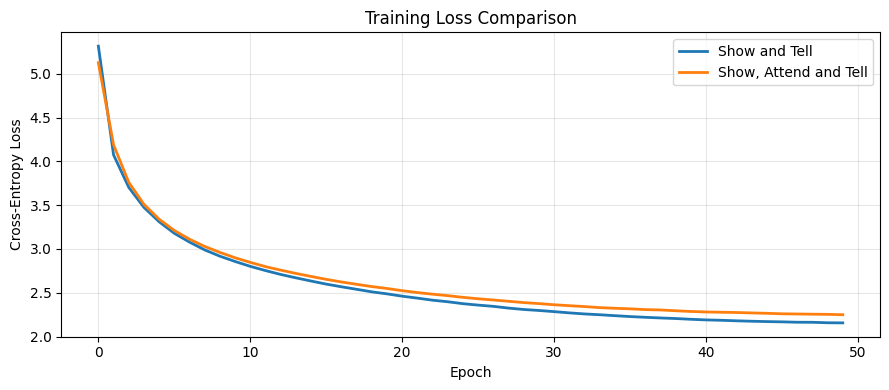

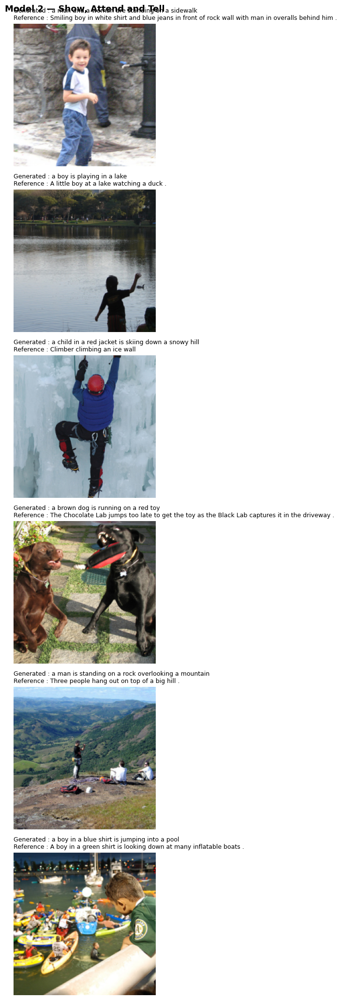


Metric                    Model 1      Model 2
----------------------------------------------
Perplexity                  15.47        15.00
BLEU-1                     0.5732       0.5893
BLEU-2                     0.3929       0.4097
BLEU-3                     0.2621       0.2750
BLEU-4                     0.1746       0.1843


In [17]:
# Training curves — both models together
plot_training_curves(
    {"Show and Tell": sat_results["train_losses"],
     "Show, Attend and Tell": satt_results["train_losses"]},
    title="Training Loss Comparison"
)

# Sample captions
show_sample_captions(satt_encoder, satt_decoder, test_loader, tokenizer, DEVICE, n=6,
                     title="Model 2 — Show, Attend and Tell")

# Metric comparison table
print("\n{:<22} {:>10} {:>12}".format("Metric", "Model 1", "Model 2"))
print("-" * 46)
print("{:<22} {:>10.2f} {:>12.2f}".format(
    "Perplexity", sat_results["perplexity"], satt_results["perplexity"]))
for k in ["BLEU-1", "BLEU-2", "BLEU-3", "BLEU-4"]:
    print("{:<22} {:>10.4f} {:>12.4f}".format(k, sat_results["bleu"][k], satt_results["bleu"][k]))

Briefly summarize how this model behaved during training, where attention seemed to help or fail, and how the BLEU score compares to Model 1.


<span style="color: red;"><strong>TODO:</strong> Write your reflection on Model 2 here.</span>


## Additional Task 1: Attention Visualization (Easy)

**Hypothesis:** If the attention mechanism is working correctly, the model should focus on semantically relevant image regions when generating each word (e.g. attend to a dog region when outputting the word *dog*).

**Experiment:** For a handful of test images we run `generate_with_attention()`, decode the caption word-by-word, and overlay the corresponding 7×7 attention map (bilinearly upsampled to 224×224) on top of the original image.

**Expected outcome:** Meaningful attention maps should show high activations near the objects or scene elements described by each token.


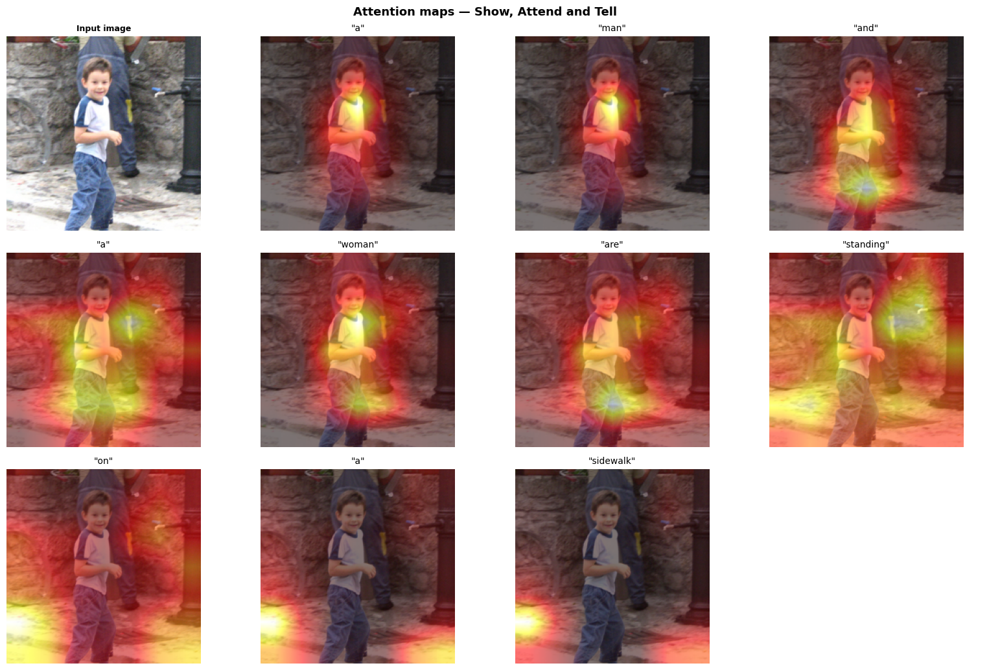

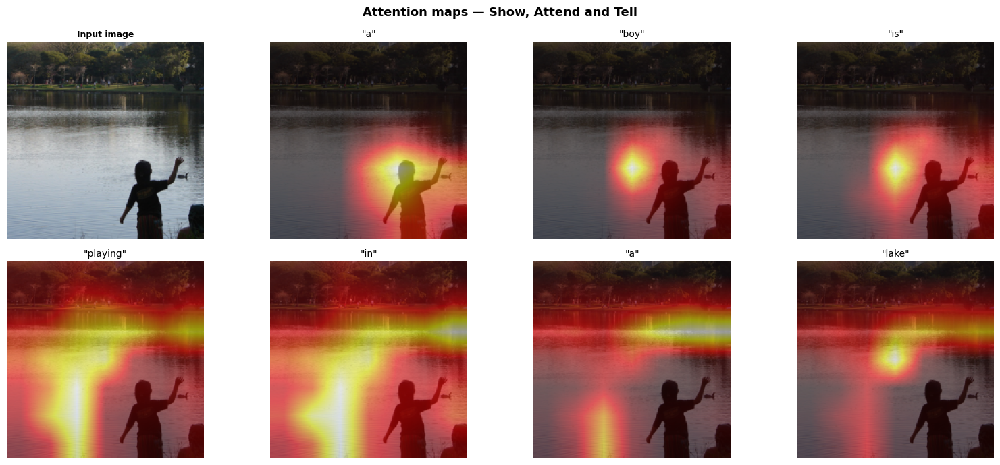

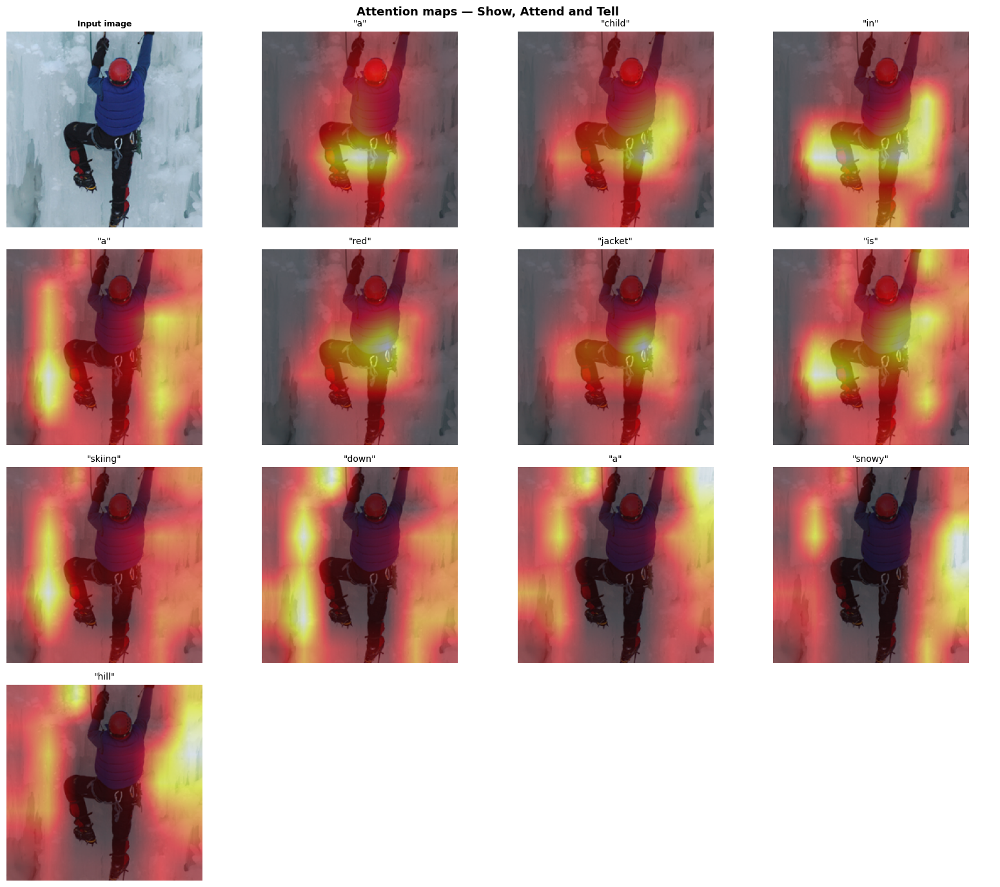

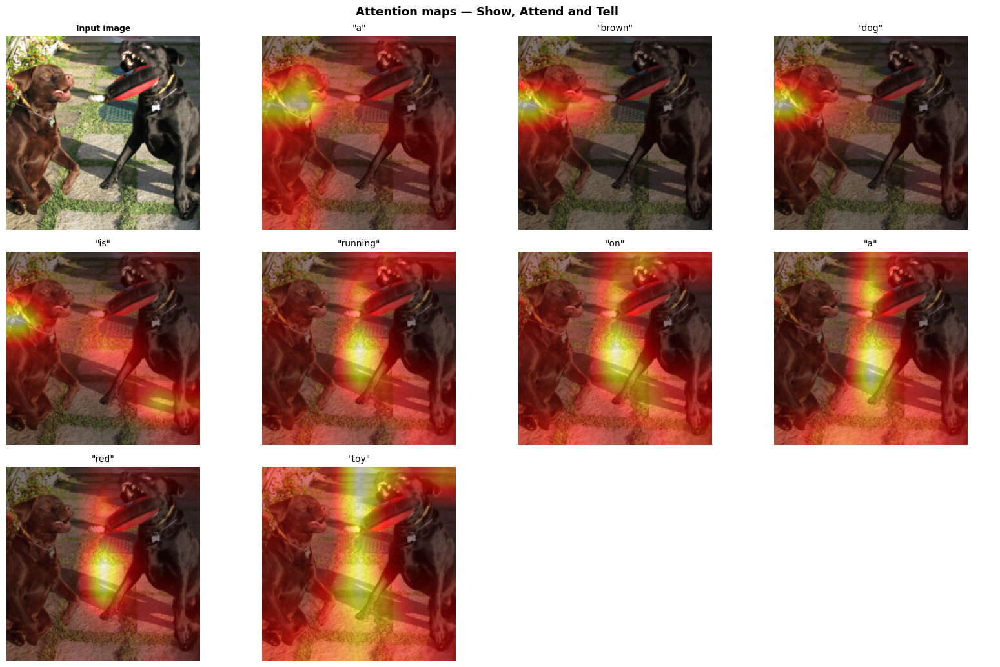

In [18]:
def visualize_attention_for_image(image_tensor: torch.Tensor,
                                   token_ids: torch.Tensor,
                                   attention_weights: torch.Tensor,
                                   tokenizer,
                                   max_words: int = 12):
    """
    Overlay attention heatmaps on the image for each generated word.
    image_tensor      : (3, H, W) — normalised tensor
    token_ids         : (max_len,) — generated ids (no BOS)
    attention_weights : (max_len, num_pixels) — e.g. (35, 49)

    Note: token_ids[t] and attention_weights[t] correspond to the SAME
    decoding step, so we must track the original index when filtering out
    special tokens like <unk>/<bos>/<pad>.
    """
    img_np = denormalize_image(image_tensor.cpu()).permute(1, 2, 0).numpy()
    grid   = int(math.sqrt(attention_weights.shape[-1]))   # 7 for a 7×7 map

    # Decode word by word, KEEPING the original time index for each kept word
    words = []  # list of (word, original_index)
    for orig_idx, tid in enumerate(token_ids.cpu().tolist()):
        word = tokenizer.itos.get(tid, "<unk>")
        if word == "<eos>":
            break
        if word not in ("<bos>", "<pad>", "<unk>"):
            words.append((word, orig_idx))
    words = words[:max_words]

    if not words:
        print("(no decodable words to visualize for this image)")
        return

    cols = 4
    rows = math.ceil((len(words) + 1) / cols)   # +1 for the original image panel
    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 3.5 * rows),
                             squeeze=False)
    axes = axes.flatten()

    # First panel: original image
    axes[0].imshow(img_np)
    axes[0].set_title("Input image", fontsize=9, weight="bold")
    axes[0].axis("off")

    for panel_idx, (word, orig_idx) in enumerate(words, start=1):
        alpha     = attention_weights[orig_idx].cpu()          # (num_pixels,)
        alpha_map = alpha.reshape(grid, grid).numpy()
        # Normalize for display so the heatmap uses the full dynamic range
        if alpha_map.max() > 0:
            alpha_map = alpha_map / alpha_map.max()
        alpha_up = np.array(
            Image.fromarray((alpha_map * 255).astype(np.uint8)).resize(
                (img_np.shape[1], img_np.shape[0]), resample=Image.BILINEAR
            )
        ) / 255.0
        axes[panel_idx].imshow(img_np)
        axes[panel_idx].imshow(alpha_up, alpha=0.55, cmap="hot", vmin=0)
        axes[panel_idx].set_title(f'"{word}"', fontsize=10)
        axes[panel_idx].axis("off")

    for j in range(len(words) + 1, len(axes)):
        axes[j].axis("off")

    plt.suptitle("Attention maps — Show, Attend and Tell", fontsize=13, weight="bold")
    plt.tight_layout()
    plt.show()


# ── Run visualisation on a few test images ───────────────────────────────────
satt_encoder.eval(); satt_decoder.eval()
vis_images, _, _, _, _ = next(iter(test_loader))
vis_images_dev = vis_images[:4].to(DEVICE)

with torch.no_grad():
    if USE_AMP:
        with torch.autocast(device_type=DEVICE.type, dtype=AMP_DTYPE):
            enc_out = satt_encoder(vis_images_dev)              # (4, 49, 512)
            tok_ids, attn_weights = satt_decoder.generate_with_attention(enc_out, tokenizer)
    else:
        enc_out = satt_encoder(vis_images_dev)
        tok_ids, attn_weights = satt_decoder.generate_with_attention(enc_out, tokenizer)

# Cast to fp32 for matplotlib / numpy ops
attn_weights = attn_weights.float()

for i in range(vis_images_dev.size(0)):
    visualize_attention_for_image(
        image_tensor=vis_images[i],
        token_ids=tok_ids[i],
        attention_weights=attn_weights[i],
        tokenizer=tokenizer,
    )


**Observation (fill in after running):**  
*Describe which words had the most focused attention, whether the model attended to correct regions, and any failure modes you observed.*


## Additional Task 2: Beam Search (Easy)

**Hypothesis:** Beam search should produce more globally coherent captions than greedy decoding because it maintains multiple candidate sequences at each step and therefore avoids locally optimal but globally suboptimal token selections.

**Experiment:** Implement beam search for the Show, Attend and Tell model and compare BLEU scores against greedy decoding on the same test set.


In [19]:
@torch.no_grad()
def beam_search_single(encoder_out: torch.Tensor, decoder: ShowAttendTellDecoder,
                        tokenizer, beam_size: int = 5, max_len: int = 35) -> list:
    """
    Beam search for a single image.
    encoder_out : (1, num_pixels, encoder_dim)
    Returns list of token ids (best hypothesis, without BOS).
    """
    device = encoder_out.device
    h, c   = decoder._init_hidden(encoder_out)           # (1, dec_dim)

    # Beams: list of (score, token_list, h, c)
    beams     = [(0.0, [tokenizer.bos_idx], h, c)]
    completed = []

    for step in range(max_len):
        all_cands = []
        for score, toks, h_b, c_b in beams:
            tok   = torch.tensor([toks[-1]], dtype=torch.long, device=device)
            emb   = decoder.embed(tok)                   # (1, E)
            ctx, alpha = decoder.attention(encoder_out, h_b)
            gate  = torch.sigmoid(decoder.beta_gate(h_b))
            ctx   = gate * ctx
            h_new, c_new = decoder.lstm(torch.cat([emb, ctx], dim=-1), (h_b, c_b))
            log_probs    = F.log_softmax(decoder.fc(h_new), dim=-1)[0]  # (V,)
            topk_lp, topk_ids = log_probs.topk(beam_size)
            for lp, tid in zip(topk_lp.tolist(), topk_ids.tolist()):
                all_cands.append((score + lp, toks + [tid], h_new, c_new))

        # Sort by score
        all_cands.sort(key=lambda x: x[0], reverse=True)

        beams = []
        for score, toks, h_b, c_b in all_cands:
            if toks[-1] == tokenizer.eos_idx:
                # Normalise by length
                completed.append((score / len(toks), toks[1:]))  # strip BOS
            else:
                beams.append((score, toks, h_b, c_b))
            if len(beams) == beam_size:
                break
        if not beams:
            break

    # Add remaining beams
    for score, toks, h_b, c_b in beams:
        completed.append((score / max(len(toks), 1), toks[1:]))

    completed.sort(key=lambda x: x[0], reverse=True)
    return completed[0][1] if completed else [tokenizer.eos_idx]


@torch.no_grad()
def compute_bleu_beam(encoder, decoder, dataloader, tokenizer, device,
                      captions_map: dict, beam_size: int = 5,
                      max_samples: int = 500) -> dict:
    """BLEU computed using beam-search decoded captions."""
    encoder.eval(); decoder.eval()
    references, hypotheses = [], []
    count = 0
    for images, _, _, image_ids, raw_caps in dataloader:
        if count >= max_samples:
            break
        for i, img in enumerate(images):
            img_dev = img.unsqueeze(0).to(device)
            enc_out = encoder(img_dev)            # (1, P, C)
            best    = beam_search_single(enc_out, decoder, tokenizer,
                                         beam_size=beam_size)
            all_caps = captions_map.get(image_ids[i], [raw_caps[i]])
            references.append([tokenize(c) for c in all_caps])
            hyp_str = tokenizer.decode(best, skip_special_tokens=True, stop_at_eos=True)
            hypotheses.append(tokenize(hyp_str))
            count += 1
            if count >= max_samples:
                break

    sf = SmoothingFunction().method1
    return {
        "BLEU-1": corpus_bleu(references, hypotheses, weights=(1,0,0,0), smoothing_function=sf),
        "BLEU-2": corpus_bleu(references, hypotheses, weights=(.5,.5,0,0), smoothing_function=sf),
        "BLEU-3": corpus_bleu(references, hypotheses, weights=(1/3,1/3,1/3,0), smoothing_function=sf),
        "BLEU-4": corpus_bleu(references, hypotheses, weights=(.25,.25,.25,.25), smoothing_function=sf),
    }


# Evaluate — greedy vs beam (subset for speed)
print("Evaluating Beam Search (beam_size=5) on 500 test samples …")
beam_bleu = compute_bleu_beam(satt_encoder, satt_decoder, test_loader,
                               tokenizer, DEVICE, test_captions_map,
                               beam_size=5, max_samples=500)

greedy_bleu_subset = compute_bleu(satt_encoder, satt_decoder, test_loader,
                                   tokenizer, DEVICE, test_captions_map,
                                   max_samples=500)

print("\n{:<22} {:>12} {:>12}".format("Metric", "Greedy", "Beam (k=5)"))
print("-" * 48)
for k in ["BLEU-1", "BLEU-2", "BLEU-3", "BLEU-4"]:
    print("{:<22} {:>12.4f} {:>12.4f}".format(k, greedy_bleu_subset[k], beam_bleu[k]))

Evaluating Beam Search (beam_size=5) on 500 test samples …


BLEU:   0%|                                                                                                   …


Metric                       Greedy   Beam (k=5)
------------------------------------------------
BLEU-1                       0.5858       0.5885
BLEU-2                       0.4123       0.4180
BLEU-3                       0.2795       0.2907
BLEU-4                       0.1886       0.2000


**Observation (fill in after running):**  
*Compare BLEU scores, inspect a few beam-search captions vs greedy, and discuss whether the improvement is consistent.*


## Additional Task 3: Alternative Attention Mechanisms (Moderate)

**Hypothesis:** Scaled dot-product attention (as used in transformer architectures) may converge faster or to a better optimum than additive Bahdanau attention because the multiplicative interaction captures alignment more sharply.

**Experiment:** Replace `AdditiveAttention` with `ScaledDotProductAttention` inside a copy of the Show, Attend and Tell decoder and train it under identical conditions. Compare BLEU and training curves.


In [20]:
# ── Scaled Dot-Product Attention ────────────────────────────────────────────
class ScaledDotProductAttention(nn.Module):
    """
    Dot-product attention: score = (W_dec * h) · (W_enc * e_i) / sqrt(d)
    where d is the attention dimension.
    """
    def __init__(self, encoder_dim: int, decoder_dim: int, attention_dim: int):
        super().__init__()
        self.W_enc  = nn.Linear(encoder_dim, attention_dim, bias=False)
        self.W_dec  = nn.Linear(decoder_dim, attention_dim, bias=False)
        self.scale  = math.sqrt(attention_dim)

    def forward(self, encoder_out: torch.Tensor, h: torch.Tensor):
        enc_proj = self.W_enc(encoder_out)                        # (B, P, d)
        dec_proj = self.W_dec(h).unsqueeze(2)                     # (B, d, 1)
        energy   = torch.bmm(enc_proj, dec_proj).squeeze(-1) / self.scale  # (B, P)
        alpha    = torch.softmax(energy, dim=-1)
        context  = (encoder_out * alpha.unsqueeze(-1)).sum(1)
        return context, alpha


# ── Decoder variant using dot-product attention ──────────────────────────────
class DotProductAttendTellDecoder(ShowAttendTellDecoder):
    """
    Identical to ShowAttendTellDecoder but uses ScaledDotProductAttention.
    Inherits forward / generate / generate_with_attention unchanged.
    """
    def __init__(self, vocab_size, encoder_dim, embed_dim, decoder_dim,
                 attention_dim, dropout=0.5, pad_idx=0):
        super().__init__(vocab_size, encoder_dim, embed_dim, decoder_dim,
                         attention_dim, dropout, pad_idx)
        # Override the attention module
        self.attention = ScaledDotProductAttention(encoder_dim, decoder_dim, attention_dim)


# ── Train the dot-product variant ────────────────────────────────────────────
dp_encoder = ShowAttendTellEncoder(freeze=SATT_FREEZE_ENC).to(DEVICE)
dp_decoder = DotProductAttendTellDecoder(
    vocab_size=len(tokenizer),
    encoder_dim=SATT_ENCODER_DIM,
    embed_dim=SATT_EMBED_DIM,
    decoder_dim=SATT_DECODER_DIM,
    attention_dim=SATT_ATTENTION_DIM,
    dropout=SATT_DROPOUT,
    pad_idx=PAD_IDX,
).to(DEVICE)

dp_results = run_training(
    encoder=dp_encoder,
    decoder=dp_decoder,
    train_loader=train_loader,
    test_loader=test_loader,
    tokenizer=tokenizer,
    device=DEVICE,
    n_epochs=SATT_N_EPOCHS,
    lr=SATT_LR,
    weight_decay=SATT_WEIGHT_DECAY,
    captions_map=test_captions_map,
    model_name="DotProductAttention",
)

 Training: DotProductAttention
------------------------------------------------------------------------
 device          : cuda
 AMP             : True (torch.bfloat16)
 epochs          : 50
 lr / wd         : 5.00e-04 / 1.00e-05
 train batches   : 64   (batch_size=512)
 val batches     : 4
 encoder params  : 0 trainable
 decoder params  : 5,712,729 trainable
 eval_every      : 1    bleu_every: 0    sample_every: 0


[DotProductAttention] Epoch 1/50:   0%|                                                                       …

[DotProductAttention] Epoch 01/50 | train_loss=5.1404 acc=17.94% | gnorm μ=0.67 max=1.98 | lr=5.00e-04 | 74.0s | val_loss=4.5161 ppl=90.55 acc=23.53%  ← new best


[DotProductAttention] Epoch 2/50:   0%|                                                                       …

[DotProductAttention] Epoch 02/50 | train_loss=4.2278 acc=26.50% | gnorm μ=0.29 max=0.43 | lr=5.00e-04 | 73.0s | val_loss=3.9596 ppl=51.93 acc=28.96%  ← new best


[DotProductAttention] Epoch 3/50:   0%|                                                                       …

[DotProductAttention] Epoch 03/50 | train_loss=3.7984 acc=30.53% | gnorm μ=0.27 max=0.52 | lr=4.98e-04 | 72.1s | val_loss=3.6237 ppl=37.94 acc=32.01%  ← new best


[DotProductAttention] Epoch 4/50:   0%|                                                                       …

[DotProductAttention] Epoch 04/50 | train_loss=3.5416 acc=32.86% | gnorm μ=0.27 max=0.48 | lr=4.96e-04 | 70.1s | val_loss=3.4248 ppl=31.29 acc=33.88%  ← new best


[DotProductAttention] Epoch 5/50:   0%|                                                                       …

[DotProductAttention] Epoch 05/50 | train_loss=3.3613 acc=34.47% | gnorm μ=0.27 max=0.49 | lr=4.93e-04 | 73.1s | val_loss=3.2825 ppl=26.35 acc=35.14%  ← new best


[DotProductAttention] Epoch 6/50:   0%|                                                                       …

[DotProductAttention] Epoch 06/50 | train_loss=3.2271 acc=35.66% | gnorm μ=0.27 max=0.51 | lr=4.89e-04 | 71.8s | val_loss=3.1860 ppl=24.05 acc=36.02%  ← new best


[DotProductAttention] Epoch 7/50:   0%|                                                                       …

[DotProductAttention] Epoch 07/50 | train_loss=3.1234 acc=36.58% | gnorm μ=0.30 max=0.55 | lr=4.84e-04 | 71.3s | val_loss=3.1100 ppl=22.65 acc=36.98%  ← new best


[DotProductAttention] Epoch 8/50:   0%|                                                                       …

[DotProductAttention] Epoch 08/50 | train_loss=3.0378 acc=37.39% | gnorm μ=0.29 max=0.55 | lr=4.79e-04 | 73.1s | val_loss=3.0564 ppl=20.77 acc=37.87%  ← new best


[DotProductAttention] Epoch 9/50:   0%|                                                                       …

[DotProductAttention] Epoch 09/50 | train_loss=2.9680 acc=38.05% | gnorm μ=0.31 max=0.50 | lr=4.72e-04 | 73.1s | val_loss=3.0301 ppl=20.27 acc=37.78%  ← new best


[DotProductAttention] Epoch 10/50:   0%|                                                                      …

[DotProductAttention] Epoch 10/50 | train_loss=2.9062 acc=38.67% | gnorm μ=0.32 max=0.61 | lr=4.65e-04 | 71.1s | val_loss=2.9744 ppl=19.43 acc=38.86%  ← new best


[DotProductAttention] Epoch 11/50:   0%|                                                                      …

[DotProductAttention] Epoch 11/50 | train_loss=2.8524 acc=39.23% | gnorm μ=0.31 max=0.59 | lr=4.57e-04 | 73.1s | val_loss=2.9434 ppl=18.88 acc=38.78%  ← new best


[DotProductAttention] Epoch 12/50:   0%|                                                                      …

[DotProductAttention] Epoch 12/50 | train_loss=2.8043 acc=39.67% | gnorm μ=0.32 max=0.58 | lr=4.48e-04 | 71.8s | val_loss=2.9431 ppl=18.76 acc=38.52%  ← new best


[DotProductAttention] Epoch 13/50:   0%|                                                                      …

[DotProductAttention] Epoch 13/50 | train_loss=2.7607 acc=40.20% | gnorm μ=0.33 max=0.70 | lr=4.39e-04 | 73.0s | val_loss=2.9165 ppl=17.92 acc=38.78%  ← new best


[DotProductAttention] Epoch 14/50:   0%|                                                                      …

[DotProductAttention] Epoch 14/50 | train_loss=2.7218 acc=40.60% | gnorm μ=0.33 max=0.57 | lr=4.29e-04 | 72.0s | val_loss=2.9128 ppl=17.76 acc=39.20%  ← new best


[DotProductAttention] Epoch 15/50:   0%|                                                                      …

[DotProductAttention] Epoch 15/50 | train_loss=2.6911 acc=40.99% | gnorm μ=0.34 max=0.62 | lr=4.18e-04 | 72.9s | val_loss=2.8753 ppl=17.37 acc=39.27%  ← new best


[DotProductAttention] Epoch 16/50:   0%|                                                                      …

[DotProductAttention] Epoch 16/50 | train_loss=2.6566 acc=41.34% | gnorm μ=0.34 max=0.65 | lr=4.07e-04 | 71.3s | val_loss=2.8701 ppl=17.40 acc=39.15%  ← new best


[DotProductAttention] Epoch 17/50:   0%|                                                                      …

[DotProductAttention] Epoch 17/50 | train_loss=2.6261 acc=41.68% | gnorm μ=0.35 max=0.63 | lr=3.96e-04 | 69.6s | val_loss=2.8547 ppl=16.85 acc=39.98%  ← new best


[DotProductAttention] Epoch 18/50:   0%|                                                                      …

[DotProductAttention] Epoch 18/50 | train_loss=2.5973 acc=42.04% | gnorm μ=0.34 max=0.71 | lr=3.83e-04 | 79.7s | val_loss=2.8336 ppl=16.77 acc=39.76%  ← new best


[DotProductAttention] Epoch 19/50:   0%|                                                                      …

[DotProductAttention] Epoch 19/50 | train_loss=2.5720 acc=42.31% | gnorm μ=0.36 max=0.62 | lr=3.71e-04 | 74.5s | val_loss=2.8501 ppl=16.75 acc=39.77%


[DotProductAttention] Epoch 20/50:   0%|                                                                      …

[DotProductAttention] Epoch 20/50 | train_loss=2.5476 acc=42.57% | gnorm μ=0.36 max=0.64 | lr=3.58e-04 | 72.4s | val_loss=2.8161 ppl=16.38 acc=39.89%  ← new best


[DotProductAttention] Epoch 21/50:   0%|                                                                      …

[DotProductAttention] Epoch 21/50 | train_loss=2.5237 acc=42.92% | gnorm μ=0.35 max=0.68 | lr=3.45e-04 | 71.7s | val_loss=2.8160 ppl=16.28 acc=40.09%  ← new best


[DotProductAttention] Epoch 22/50:   0%|                                                                      …

[DotProductAttention] Epoch 22/50 | train_loss=2.5033 acc=43.17% | gnorm μ=0.36 max=0.69 | lr=3.31e-04 | 71.1s | val_loss=2.8114 ppl=16.21 acc=40.15%  ← new best


[DotProductAttention] Epoch 23/50:   0%|                                                                      …

[DotProductAttention] Epoch 23/50 | train_loss=2.4858 acc=43.44% | gnorm μ=0.37 max=0.70 | lr=3.17e-04 | 72.4s | val_loss=2.8208 ppl=16.42 acc=39.94%


[DotProductAttention] Epoch 24/50:   0%|                                                                      …

[DotProductAttention] Epoch 24/50 | train_loss=2.4630 acc=43.71% | gnorm μ=0.36 max=0.65 | lr=3.03e-04 | 71.8s | val_loss=2.7769 ppl=15.80 acc=40.69%  ← new best


[DotProductAttention] Epoch 25/50:   0%|                                                                      …

[DotProductAttention] Epoch 25/50 | train_loss=2.4460 acc=43.99% | gnorm μ=0.37 max=0.66 | lr=2.89e-04 | 71.8s | val_loss=2.7784 ppl=15.84 acc=40.42%


[DotProductAttention] Epoch 26/50:   0%|                                                                      …

[DotProductAttention] Epoch 26/50 | train_loss=2.4290 acc=44.22% | gnorm μ=0.37 max=0.72 | lr=2.75e-04 | 71.7s | val_loss=2.7834 ppl=15.80 acc=40.39%


[DotProductAttention] Epoch 27/50:   0%|                                                                      …

[DotProductAttention] Epoch 27/50 | train_loss=2.4151 acc=44.43% | gnorm μ=0.37 max=0.71 | lr=2.61e-04 | 72.4s | val_loss=2.7690 ppl=16.05 acc=40.27%  ← new best


[DotProductAttention] Epoch 28/50:   0%|                                                                      …

[DotProductAttention] Epoch 28/50 | train_loss=2.3986 acc=44.64% | gnorm μ=0.38 max=0.75 | lr=2.47e-04 | 72.1s | val_loss=2.7581 ppl=15.36 acc=40.65%  ← new best


[DotProductAttention] Epoch 29/50:   0%|                                                                      …

[DotProductAttention] Epoch 29/50 | train_loss=2.3859 acc=44.85% | gnorm μ=0.38 max=0.76 | lr=2.33e-04 | 73.1s | val_loss=2.7493 ppl=15.65 acc=40.56%  ← new best


[DotProductAttention] Epoch 30/50:   0%|                                                                      …

[DotProductAttention] Epoch 30/50 | train_loss=2.3745 acc=45.00% | gnorm μ=0.38 max=0.71 | lr=2.19e-04 | 69.7s | val_loss=2.8025 ppl=15.75 acc=40.45%


[DotProductAttention] Epoch 31/50:   0%|                                                                      …

[DotProductAttention] Epoch 31/50 | train_loss=2.3608 acc=45.22% | gnorm μ=0.38 max=0.70 | lr=2.05e-04 | 72.6s | val_loss=2.7817 ppl=15.90 acc=40.39%


[DotProductAttention] Epoch 32/50:   0%|                                                                      …

[DotProductAttention] Epoch 32/50 | train_loss=2.3488 acc=45.41% | gnorm μ=0.39 max=0.80 | lr=1.92e-04 | 72.5s | val_loss=2.7727 ppl=15.93 acc=40.28%


[DotProductAttention] Epoch 33/50:   0%|                                                                      …

[DotProductAttention] Epoch 33/50 | train_loss=2.3396 acc=45.50% | gnorm μ=0.38 max=0.75 | lr=1.79e-04 | 72.3s | val_loss=2.7651 ppl=15.78 acc=40.17%


[DotProductAttention] Epoch 34/50:   0%|                                                                      …

[DotProductAttention] Epoch 34/50 | train_loss=2.3273 acc=45.65% | gnorm μ=0.37 max=0.73 | lr=1.67e-04 | 71.4s | val_loss=2.7513 ppl=15.69 acc=40.85%


[DotProductAttention] Epoch 35/50:   0%|                                                                      …

[DotProductAttention] Epoch 35/50 | train_loss=2.3206 acc=45.74% | gnorm μ=0.38 max=0.68 | lr=1.54e-04 | 70.9s | val_loss=2.7577 ppl=15.57 acc=40.46%


[DotProductAttention] Epoch 36/50:   0%|                                                                      …

[DotProductAttention] Epoch 36/50 | train_loss=2.3103 acc=45.88% | gnorm μ=0.38 max=0.75 | lr=1.43e-04 | 71.7s | val_loss=2.7789 ppl=15.83 acc=40.36%


[DotProductAttention] Epoch 37/50:   0%|                                                                      …

[DotProductAttention] Epoch 37/50 | train_loss=2.3029 acc=46.06% | gnorm μ=0.38 max=0.78 | lr=1.32e-04 | 71.9s | val_loss=2.7605 ppl=15.51 acc=40.43%


[DotProductAttention] Epoch 38/50:   0%|                                                                      …

[DotProductAttention] Epoch 38/50 | train_loss=2.2951 acc=46.13% | gnorm μ=0.38 max=0.74 | lr=1.21e-04 | 71.2s | val_loss=2.7755 ppl=16.07 acc=39.76%


[DotProductAttention] Epoch 39/50:   0%|                                                                      …

[DotProductAttention] Epoch 39/50 | train_loss=2.2887 acc=46.20% | gnorm μ=0.38 max=0.76 | lr=1.11e-04 | 70.7s | val_loss=2.7735 ppl=15.49 acc=40.32%


[DotProductAttention] Epoch 40/50:   0%|                                                                      …

[DotProductAttention] Epoch 40/50 | train_loss=2.2839 acc=46.36% | gnorm μ=0.38 max=0.75 | lr=1.02e-04 | 71.8s | val_loss=2.7614 ppl=15.53 acc=40.32%


[DotProductAttention] Epoch 41/50:   0%|                                                                      …

[DotProductAttention] Epoch 41/50 | train_loss=2.2764 acc=46.44% | gnorm μ=0.39 max=0.81 | lr=9.30e-05 | 72.0s | val_loss=2.7668 ppl=15.45 acc=40.59%


[DotProductAttention] Epoch 42/50:   0%|                                                                      …

[DotProductAttention] Epoch 42/50 | train_loss=2.2726 acc=46.52% | gnorm μ=0.39 max=0.75 | lr=8.50e-05 | 71.4s | val_loss=2.7046 ppl=15.02 acc=41.14%  ← new best


[DotProductAttention] Epoch 43/50:   0%|                                                                      …

[DotProductAttention] Epoch 43/50 | train_loss=2.2689 acc=46.60% | gnorm μ=0.38 max=0.75 | lr=7.78e-05 | 69.6s | val_loss=2.7467 ppl=15.58 acc=39.75%


[DotProductAttention] Epoch 44/50:   0%|                                                                      …

[DotProductAttention] Epoch 44/50 | train_loss=2.2623 acc=46.73% | gnorm μ=0.38 max=0.79 | lr=7.14e-05 | 70.1s | val_loss=2.7647 ppl=15.39 acc=40.65%


[DotProductAttention] Epoch 45/50:   0%|                                                                      …

[DotProductAttention] Epoch 45/50 | train_loss=2.2585 acc=46.72% | gnorm μ=0.38 max=0.89 | lr=6.58e-05 | 70.8s | val_loss=2.7339 ppl=15.15 acc=41.01%


[DotProductAttention] Epoch 46/50:   0%|                                                                      …

[DotProductAttention] Epoch 46/50 | train_loss=2.2572 acc=46.75% | gnorm μ=0.38 max=0.81 | lr=6.10e-05 | 72.1s | val_loss=2.7572 ppl=15.46 acc=40.69%


[DotProductAttention] Epoch 47/50:   0%|                                                                      …

[DotProductAttention] Epoch 47/50 | train_loss=2.2525 acc=46.81% | gnorm μ=0.38 max=0.76 | lr=5.71e-05 | 71.9s | val_loss=2.7627 ppl=15.63 acc=40.23%


[DotProductAttention] Epoch 48/50:   0%|                                                                      …

[DotProductAttention] Epoch 48/50 | train_loss=2.2500 acc=46.85% | gnorm μ=0.38 max=0.81 | lr=5.40e-05 | 73.0s | val_loss=2.7206 ppl=15.05 acc=40.53%


[DotProductAttention] Epoch 49/50:   0%|                                                                      …

[DotProductAttention] Epoch 49/50 | train_loss=2.2486 acc=46.89% | gnorm μ=0.38 max=0.80 | lr=5.18e-05 | 71.8s | val_loss=2.7301 ppl=15.21 acc=40.92%


[DotProductAttention] Epoch 50/50:   0%|                                                                      …

[DotProductAttention] Epoch 50/50 | train_loss=2.2443 acc=46.99% | gnorm μ=0.38 max=0.80 | lr=5.04e-05 | 71.9s | val_loss=2.7549 ppl=15.20 acc=40.93%
------------------------------------------------------------------------
 Training finished in 63.1 min (75.7s/epoch on average)


BLEU:   0%|                                                                                                   …


[DotProductAttention] Final Perplexity: 15.27
   BLEU-1: 0.5812
   BLEU-2: 0.4023
   BLEU-3: 0.2695
   BLEU-4: 0.1802


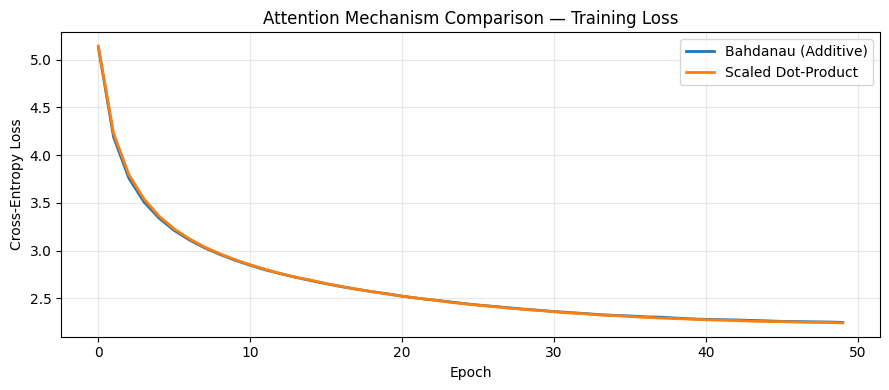


Metric                       Bahdanau      Dot-Product
------------------------------------------------------
Perplexity                      15.00            15.27
BLEU-1                         0.5893           0.5812
BLEU-2                         0.4097           0.4023
BLEU-3                         0.2750           0.2695
BLEU-4                         0.1843           0.1802


In [21]:
# Compare training curves and metrics: Bahdanau vs Dot-Product
plot_training_curves(
    {"Bahdanau (Additive)": satt_results["train_losses"],
     "Scaled Dot-Product":  dp_results["train_losses"]},
    title="Attention Mechanism Comparison — Training Loss"
)

print("\n{:<22} {:>14} {:>16}".format("Metric", "Bahdanau", "Dot-Product"))
print("-" * 54)
print("{:<22} {:>14.2f} {:>16.2f}".format(
    "Perplexity", satt_results["perplexity"], dp_results["perplexity"]))
for k in ["BLEU-1", "BLEU-2", "BLEU-3", "BLEU-4"]:
    print("{:<22} {:>14.4f} {:>16.4f}".format(
        k, satt_results["bleu"][k], dp_results["bleu"][k]))

**Observation (fill in after running):**  
*Discuss convergence speed, final BLEU, and whether one attention type produces qualitatively better captions.*


## Additional Task 4: Transformer-Based Decoder (Hard)

**Hypothesis:** A transformer decoder with multi-head cross-attention to the spatial image features can model long-range dependencies more effectively than an LSTM, potentially achieving higher BLEU scores.

**Experiment:** Re-use the same `ShowAttendTellEncoder` (spatial 49×512 features) and replace the LSTM with a stack of `nn.TransformerDecoderLayer`s. Compare training curves and BLEU against both LSTM models.


In [22]:
# ── Transformer-based Captioner ─────────────────────────────────────────────
class TransformerDecoder(nn.Module):
    """
    Transformer decoder for image captioning.
    - Memory: spatial image features from ShowAttendTellEncoder → (B, 49, 512)
    - Target: token embeddings + sinusoidal-style learnable positional encoding
    - Outputs token logits (B, T-1, vocab_size) during training,
      greedy token ids (B, max_len) during inference.
    """
    def __init__(self, vocab_size: int, encoder_dim: int = 512,
                 embed_dim: int = 256, nhead: int = 4,
                 num_layers: int = 3, ffn_dim: int = 1024,
                 dropout: float = 0.1, max_pos: int = 60,
                 pad_idx: int = 0):
        super().__init__()
        assert embed_dim % nhead == 0, "embed_dim must be divisible by nhead"
        self.pad_idx  = pad_idx
        self.embed    = nn.Embedding(vocab_size, embed_dim, padding_idx=pad_idx)
        self.pos_emb  = nn.Embedding(max_pos, embed_dim)
        self.enc_proj = nn.Linear(encoder_dim, embed_dim)
        dec_layer = nn.TransformerDecoderLayer(
            d_model=embed_dim, nhead=nhead, dim_feedforward=ffn_dim,
            dropout=dropout, batch_first=True, norm_first=True,
        )
        self.decoder = nn.TransformerDecoder(dec_layer, num_layers=num_layers,
                                              norm=nn.LayerNorm(embed_dim))
        self.fc      = nn.Linear(embed_dim, vocab_size)
        self.drop    = nn.Dropout(dropout)
        self._init_weights()

    def _init_weights(self):
        nn.init.normal_(self.embed.weight, std=0.02)
        nn.init.normal_(self.pos_emb.weight, std=0.02)

    @staticmethod
    def _causal_mask(sz: int, device) -> torch.Tensor:
        return torch.triu(torch.ones(sz, sz, device=device, dtype=torch.bool), diagonal=1)

    def forward(self, enc_out: torch.Tensor, captions: torch.Tensor) -> torch.Tensor:
        """
        enc_out  : (B, num_pixels, encoder_dim)  — from spatial encoder
        captions : (B, max_len)  — includes BOS; target is captions[:, 1:]
        """
        B, device = captions.size(0), captions.device
        tgt = captions[:, :-1]                             # (B, T-1)
        T   = tgt.size(1)

        pos  = torch.arange(T, device=device).unsqueeze(0).expand(B, -1)
        x    = self.drop(self.embed(tgt) + self.pos_emb(pos))   # (B, T-1, E)

        mem  = self.enc_proj(enc_out)                      # (B, P, E)
        mask = self._causal_mask(T, device)
        pad_mask = (tgt == self.pad_idx)                   # (B, T-1) — True = ignore

        out  = self.decoder(x, mem, tgt_mask=mask, tgt_key_padding_mask=pad_mask)
        return self.fc(out)                                # (B, T-1, V)

    @torch.no_grad()
    def generate(self, enc_out: torch.Tensor, tokenizer, max_len: int = 35) -> torch.Tensor:
        self.eval()
        B, device = enc_out.size(0), enc_out.device
        mem = self.enc_proj(enc_out)                       # (B, P, E)
        generated = torch.full((B, 1), tokenizer.bos_idx, dtype=torch.long, device=device)

        for step in range(max_len):
            T   = generated.size(1)
            pos = torch.arange(T, device=device).unsqueeze(0).expand(B, -1)
            x   = self.embed(generated) + self.pos_emb(pos)
            msk = self._causal_mask(T, device)
            out = self.decoder(x, mem, tgt_mask=msk)
            nxt = self.fc(out[:, -1]).argmax(-1, keepdim=True)   # (B, 1)
            generated = torch.cat([generated, nxt], dim=1)
            if (nxt == tokenizer.eos_idx).all():
                break

        return generated[:, 1:]   # strip BOS  →  (B, ≤max_len)


# Shared spatial encoder (same weights as SATT for fair comparison)
tr_encoder = ShowAttendTellEncoder(freeze=SATT_FREEZE_ENC).to(DEVICE)
tr_decoder = TransformerDecoder(
    vocab_size=len(tokenizer),
    encoder_dim=SATT_ENCODER_DIM,
    embed_dim=256,
    nhead=4,
    num_layers=3,
    ffn_dim=1024,
    dropout=0.1,
    max_pos=MAX_LEN + 5,
    pad_idx=PAD_IDX,
).to(DEVICE)

total_params = sum(p.numel() for p in list(tr_encoder.parameters()) + list(tr_decoder.parameters()))
print(f"Transformer Captioner total params: {total_params:,}")

tr_results = run_training(
    encoder=tr_encoder,
    decoder=tr_decoder,
    train_loader=train_loader,
    test_loader=test_loader,
    tokenizer=tokenizer,
    device=DEVICE,
    n_epochs=SATT_N_EPOCHS,
    lr=1e-4,                  # transformers prefer a lower, warmed-up lr
    weight_decay=1e-4,
    captions_map=test_captions_map,
    model_name="TransformerDecoder",
)

Transformer Captioner total params: 15,839,129
 Training: TransformerDecoder
------------------------------------------------------------------------
 device          : cuda
 AMP             : True (torch.bfloat16)
 epochs          : 50
 lr / wd         : 1.00e-04 / 1.00e-04
 train batches   : 64   (batch_size=512)
 val batches     : 4
 encoder params  : 0 trainable
 decoder params  : 4,662,617 trainable
 eval_every      : 1    bleu_every: 0    sample_every: 0


[TransformerDecoder] Epoch 1/50:   0%|                                                                        …

[TransformerDecoder] Epoch 01/50 | train_loss=5.9983 acc=17.58% | gnorm μ=1.67 max=4.53 | lr=1.00e-04 | 73.5s | val_loss=5.0662 ppl=159.65 acc=23.25%  ← new best


[TransformerDecoder] Epoch 2/50:   0%|                                                                        …

[TransformerDecoder] Epoch 02/50 | train_loss=4.7615 acc=25.18% | gnorm μ=0.72 max=0.97 | lr=9.99e-05 | 71.8s | val_loss=4.4227 ppl=82.78 acc=27.14%  ← new best


[TransformerDecoder] Epoch 3/50:   0%|                                                                        …

[TransformerDecoder] Epoch 03/50 | train_loss=4.2987 acc=28.41% | gnorm μ=0.61 max=1.10 | lr=9.96e-05 | 71.9s | val_loss=4.0646 ppl=58.65 acc=30.83%  ← new best


[TransformerDecoder] Epoch 4/50:   0%|                                                                        …

[TransformerDecoder] Epoch 04/50 | train_loss=3.9943 acc=31.14% | gnorm μ=0.65 max=1.13 | lr=9.92e-05 | 72.1s | val_loss=3.8099 ppl=46.06 acc=32.26%  ← new best


[TransformerDecoder] Epoch 5/50:   0%|                                                                        …

[TransformerDecoder] Epoch 05/50 | train_loss=3.7905 acc=32.75% | gnorm μ=0.66 max=1.20 | lr=9.86e-05 | 72.2s | val_loss=3.6676 ppl=38.82 acc=33.83%  ← new best


[TransformerDecoder] Epoch 6/50:   0%|                                                                        …

[TransformerDecoder] Epoch 06/50 | train_loss=3.6437 acc=33.83% | gnorm μ=0.69 max=1.45 | lr=9.78e-05 | 71.1s | val_loss=3.5398 ppl=34.44 acc=34.66%  ← new best


[TransformerDecoder] Epoch 7/50:   0%|                                                                        …

[TransformerDecoder] Epoch 07/50 | train_loss=3.5227 acc=34.76% | gnorm μ=0.72 max=1.53 | lr=9.68e-05 | 70.4s | val_loss=3.4200 ppl=30.90 acc=35.93%  ← new best


[TransformerDecoder] Epoch 8/50:   0%|                                                                        …

[TransformerDecoder] Epoch 08/50 | train_loss=3.4196 acc=35.61% | gnorm μ=0.74 max=1.43 | lr=9.57e-05 | 72.5s | val_loss=3.3790 ppl=28.67 acc=36.21%  ← new best


[TransformerDecoder] Epoch 9/50:   0%|                                                                        …

[TransformerDecoder] Epoch 09/50 | train_loss=3.3321 acc=36.44% | gnorm μ=0.75 max=1.55 | lr=9.44e-05 | 71.4s | val_loss=3.2802 ppl=26.00 acc=37.01%  ← new best


[TransformerDecoder] Epoch 10/50:   0%|                                                                       …

[TransformerDecoder] Epoch 10/50 | train_loss=3.2595 acc=37.08% | gnorm μ=0.77 max=1.47 | lr=9.30e-05 | 78.6s | val_loss=3.2306 ppl=24.62 acc=37.75%  ← new best


[TransformerDecoder] Epoch 11/50:   0%|                                                                       …

[TransformerDecoder] Epoch 11/50 | train_loss=3.1928 acc=37.61% | gnorm μ=0.79 max=1.55 | lr=9.14e-05 | 78.6s | val_loss=3.2040 ppl=24.32 acc=37.47%  ← new best


[TransformerDecoder] Epoch 12/50:   0%|                                                                       …

[TransformerDecoder] Epoch 12/50 | train_loss=3.1355 acc=38.08% | gnorm μ=0.78 max=1.45 | lr=8.97e-05 | 80.9s | val_loss=3.1016 ppl=22.15 acc=38.43%  ← new best


[TransformerDecoder] Epoch 13/50:   0%|                                                                       …

[TransformerDecoder] Epoch 13/50 | train_loss=3.0830 acc=38.59% | gnorm μ=0.79 max=1.56 | lr=8.78e-05 | 81.9s | val_loss=3.0786 ppl=21.64 acc=38.74%  ← new best


[TransformerDecoder] Epoch 14/50:   0%|                                                                       …

[TransformerDecoder] Epoch 14/50 | train_loss=3.0382 acc=39.03% | gnorm μ=0.79 max=1.49 | lr=8.58e-05 | 81.4s | val_loss=3.1009 ppl=21.91 acc=38.23%


[TransformerDecoder] Epoch 15/50:   0%|                                                                       …

[TransformerDecoder] Epoch 15/50 | train_loss=2.9988 acc=39.26% | gnorm μ=0.84 max=1.60 | lr=8.37e-05 | 76.0s | val_loss=3.0108 ppl=20.12 acc=39.45%  ← new best


[TransformerDecoder] Epoch 16/50:   0%|                                                                       …

[TransformerDecoder] Epoch 16/50 | train_loss=2.9612 acc=39.62% | gnorm μ=0.85 max=1.58 | lr=8.15e-05 | 72.7s | val_loss=3.0140 ppl=19.89 acc=39.42%


[TransformerDecoder] Epoch 17/50:   0%|                                                                       …

[TransformerDecoder] Epoch 17/50 | train_loss=2.9249 acc=40.00% | gnorm μ=0.83 max=1.54 | lr=7.91e-05 | 71.5s | val_loss=3.0049 ppl=19.94 acc=39.09%  ← new best


[TransformerDecoder] Epoch 18/50:   0%|                                                                       …

[TransformerDecoder] Epoch 18/50 | train_loss=2.8951 acc=40.31% | gnorm μ=0.82 max=1.53 | lr=7.67e-05 | 71.1s | val_loss=2.9787 ppl=19.49 acc=39.40%  ← new best


[TransformerDecoder] Epoch 19/50:   0%|                                                                       …

[TransformerDecoder] Epoch 19/50 | train_loss=2.8651 acc=40.62% | gnorm μ=0.84 max=1.63 | lr=7.42e-05 | 71.0s | val_loss=2.9708 ppl=18.90 acc=39.60%  ← new best


[TransformerDecoder] Epoch 20/50:   0%|                                                                       …

[TransformerDecoder] Epoch 20/50 | train_loss=2.8393 acc=40.87% | gnorm μ=0.88 max=1.58 | lr=7.16e-05 | 70.8s | val_loss=2.9073 ppl=18.55 acc=39.73%  ← new best


[TransformerDecoder] Epoch 21/50:   0%|                                                                       …

[TransformerDecoder] Epoch 21/50 | train_loss=2.8153 acc=41.09% | gnorm μ=0.86 max=1.64 | lr=6.89e-05 | 69.5s | val_loss=2.9521 ppl=18.35 acc=39.94%


[TransformerDecoder] Epoch 22/50:   0%|                                                                       …

[TransformerDecoder] Epoch 22/50 | train_loss=2.7948 acc=41.32% | gnorm μ=0.87 max=1.72 | lr=6.62e-05 | 71.4s | val_loss=2.9329 ppl=18.18 acc=40.32%


[TransformerDecoder] Epoch 23/50:   0%|                                                                       …

[TransformerDecoder] Epoch 23/50 | train_loss=2.7730 acc=41.57% | gnorm μ=0.87 max=1.67 | lr=6.34e-05 | 73.1s | val_loss=2.8721 ppl=17.58 acc=40.54%  ← new best


[TransformerDecoder] Epoch 24/50:   0%|                                                                       …

[TransformerDecoder] Epoch 24/50 | train_loss=2.7526 acc=41.78% | gnorm μ=0.85 max=1.70 | lr=6.06e-05 | 72.0s | val_loss=2.8631 ppl=17.34 acc=40.75%  ← new best


[TransformerDecoder] Epoch 25/50:   0%|                                                                       …

[TransformerDecoder] Epoch 25/50 | train_loss=2.7343 acc=41.97% | gnorm μ=0.89 max=1.75 | lr=5.78e-05 | 72.9s | val_loss=2.9001 ppl=17.76 acc=40.28%


[TransformerDecoder] Epoch 26/50:   0%|                                                                       …

[TransformerDecoder] Epoch 26/50 | train_loss=2.7175 acc=42.10% | gnorm μ=0.89 max=1.71 | lr=5.50e-05 | 73.6s | val_loss=2.8411 ppl=17.03 acc=40.83%  ← new best


[TransformerDecoder] Epoch 27/50:   0%|                                                                       …

[TransformerDecoder] Epoch 27/50 | train_loss=2.7010 acc=42.36% | gnorm μ=0.88 max=1.75 | lr=5.22e-05 | 75.6s | val_loss=2.8407 ppl=17.04 acc=40.57%  ← new best


[TransformerDecoder] Epoch 28/50:   0%|                                                                       …

[TransformerDecoder] Epoch 28/50 | train_loss=2.6881 acc=42.46% | gnorm μ=0.89 max=1.83 | lr=4.94e-05 | 71.7s | val_loss=2.8293 ppl=16.46 acc=41.28%  ← new best


[TransformerDecoder] Epoch 29/50:   0%|                                                                       …

[TransformerDecoder] Epoch 29/50 | train_loss=2.6745 acc=42.56% | gnorm μ=0.90 max=1.79 | lr=4.66e-05 | 72.0s | val_loss=2.8456 ppl=17.00 acc=41.10%


[TransformerDecoder] Epoch 30/50:   0%|                                                                       …

[TransformerDecoder] Epoch 30/50 | train_loss=2.6621 acc=42.74% | gnorm μ=0.90 max=1.70 | lr=4.38e-05 | 72.5s | val_loss=2.8142 ppl=16.71 acc=40.59%  ← new best


[TransformerDecoder] Epoch 31/50:   0%|                                                                       …

[TransformerDecoder] Epoch 31/50 | train_loss=2.6496 acc=42.84% | gnorm μ=0.91 max=1.81 | lr=4.11e-05 | 71.7s | val_loss=2.8353 ppl=16.84 acc=40.33%


[TransformerDecoder] Epoch 32/50:   0%|                                                                       …

[TransformerDecoder] Epoch 32/50 | train_loss=2.6392 acc=42.98% | gnorm μ=0.92 max=1.81 | lr=3.84e-05 | 71.2s | val_loss=2.8327 ppl=16.74 acc=41.05%


[TransformerDecoder] Epoch 33/50:   0%|                                                                       …

[TransformerDecoder] Epoch 33/50 | train_loss=2.6311 acc=43.03% | gnorm μ=0.91 max=1.93 | lr=3.58e-05 | 70.8s | val_loss=2.8272 ppl=16.43 acc=41.18%


[TransformerDecoder] Epoch 34/50:   0%|                                                                       …

[TransformerDecoder] Epoch 34/50 | train_loss=2.6210 acc=43.20% | gnorm μ=0.91 max=1.83 | lr=3.33e-05 | 70.7s | val_loss=2.8110 ppl=16.53 acc=40.86%  ← new best


[TransformerDecoder] Epoch 35/50:   0%|                                                                       …

[TransformerDecoder] Epoch 35/50 | train_loss=2.6096 acc=43.26% | gnorm μ=0.91 max=1.87 | lr=3.09e-05 | 71.0s | val_loss=2.7758 ppl=15.95 acc=41.17%  ← new best


[TransformerDecoder] Epoch 36/50:   0%|                                                                       …

[TransformerDecoder] Epoch 36/50 | train_loss=2.6025 acc=43.33% | gnorm μ=0.92 max=1.91 | lr=2.85e-05 | 72.4s | val_loss=2.8247 ppl=16.28 acc=41.05%


[TransformerDecoder] Epoch 37/50:   0%|                                                                       …

[TransformerDecoder] Epoch 37/50 | train_loss=2.5971 acc=43.45% | gnorm μ=0.92 max=1.88 | lr=2.63e-05 | 73.0s | val_loss=2.8187 ppl=16.59 acc=40.73%


[TransformerDecoder] Epoch 38/50:   0%|                                                                       …

[TransformerDecoder] Epoch 38/50 | train_loss=2.5894 acc=43.50% | gnorm μ=0.92 max=1.88 | lr=2.42e-05 | 73.0s | val_loss=2.7630 ppl=16.03 acc=41.07%  ← new best


[TransformerDecoder] Epoch 39/50:   0%|                                                                       …

[TransformerDecoder] Epoch 39/50 | train_loss=2.5847 acc=43.57% | gnorm μ=0.92 max=1.86 | lr=2.22e-05 | 71.7s | val_loss=2.8041 ppl=16.12 acc=41.02%


[TransformerDecoder] Epoch 40/50:   0%|                                                                       …

[TransformerDecoder] Epoch 40/50 | train_loss=2.5786 acc=43.62% | gnorm μ=0.93 max=2.10 | lr=2.03e-05 | 72.6s | val_loss=2.8206 ppl=16.09 acc=41.13%


[TransformerDecoder] Epoch 41/50:   0%|                                                                       …

[TransformerDecoder] Epoch 41/50 | train_loss=2.5724 acc=43.66% | gnorm μ=0.93 max=1.97 | lr=1.86e-05 | 72.6s | val_loss=2.7934 ppl=16.25 acc=41.23%


[TransformerDecoder] Epoch 42/50:   0%|                                                                       …

[TransformerDecoder] Epoch 42/50 | train_loss=2.5712 acc=43.80% | gnorm μ=0.92 max=2.12 | lr=1.70e-05 | 71.8s | val_loss=2.8256 ppl=16.17 acc=40.92%


[TransformerDecoder] Epoch 43/50:   0%|                                                                       …

[TransformerDecoder] Epoch 43/50 | train_loss=2.5659 acc=43.81% | gnorm μ=0.92 max=1.86 | lr=1.56e-05 | 71.8s | val_loss=2.8278 ppl=16.36 acc=41.01%


[TransformerDecoder] Epoch 44/50:   0%|                                                                       …

[TransformerDecoder] Epoch 44/50 | train_loss=2.5611 acc=43.86% | gnorm μ=0.93 max=2.03 | lr=1.43e-05 | 72.5s | val_loss=2.7917 ppl=15.78 acc=41.30%


[TransformerDecoder] Epoch 45/50:   0%|                                                                       …

[TransformerDecoder] Epoch 45/50 | train_loss=2.5570 acc=43.89% | gnorm μ=0.92 max=1.96 | lr=1.32e-05 | 71.4s | val_loss=2.7611 ppl=16.01 acc=40.91%  ← new best


[TransformerDecoder] Epoch 46/50:   0%|                                                                       …

[TransformerDecoder] Epoch 46/50 | train_loss=2.5551 acc=43.83% | gnorm μ=0.92 max=1.89 | lr=1.22e-05 | 72.9s | val_loss=2.8128 ppl=16.13 acc=41.00%


[TransformerDecoder] Epoch 47/50:   0%|                                                                       …

[TransformerDecoder] Epoch 47/50 | train_loss=2.5509 acc=43.95% | gnorm μ=0.93 max=1.99 | lr=1.14e-05 | 70.2s | val_loss=2.7694 ppl=15.64 acc=42.05%


[TransformerDecoder] Epoch 48/50:   0%|                                                                       …

[TransformerDecoder] Epoch 48/50 | train_loss=2.5477 acc=43.97% | gnorm μ=0.93 max=1.95 | lr=1.08e-05 | 69.0s | val_loss=2.7952 ppl=16.11 acc=40.80%


[TransformerDecoder] Epoch 49/50:   0%|                                                                       …

[TransformerDecoder] Epoch 49/50 | train_loss=2.5459 acc=43.97% | gnorm μ=0.93 max=1.89 | lr=1.04e-05 | 71.5s | val_loss=2.7838 ppl=15.89 acc=41.58%


[TransformerDecoder] Epoch 50/50:   0%|                                                                       …

[TransformerDecoder] Epoch 50/50 | train_loss=2.5438 acc=44.07% | gnorm μ=0.93 max=1.92 | lr=1.01e-05 | 73.1s | val_loss=2.7766 ppl=16.08 acc=41.10%
------------------------------------------------------------------------
 Training finished in 63.7 min (76.5s/epoch on average)


BLEU:   0%|                                                                                                   …


[TransformerDecoder] Final Perplexity: 15.64
   BLEU-1: 0.5730
   BLEU-2: 0.3970
   BLEU-3: 0.2653
   BLEU-4: 0.1761


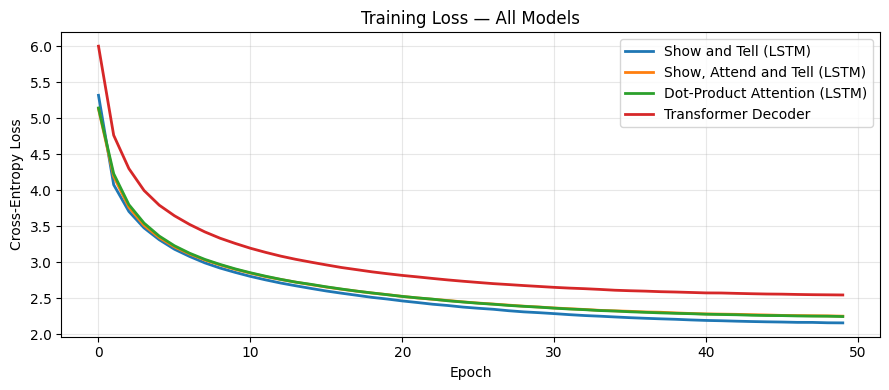

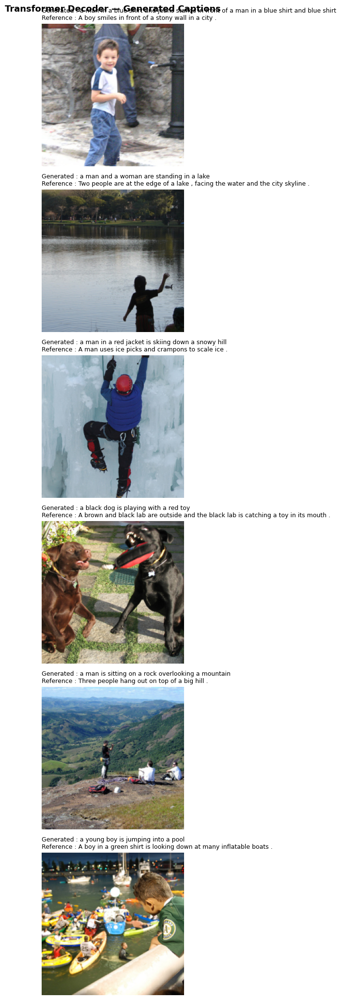


Metric                       M1 (SaT) M2 (SATaT)  M3 (DotPrd)   M4 (Transf.)
----------------------------------------------------------------------------
Perplexity                      15.47      15.00        15.27          15.64
BLEU-1                         0.5732     0.5893       0.5812         0.5730
BLEU-2                         0.3929     0.4097       0.4023         0.3970
BLEU-3                         0.2621     0.2750       0.2695         0.2653
BLEU-4                         0.1746     0.1843       0.1802         0.1761


In [23]:
# All four models compared (LSTM + Attention LSTM + DotProduct + Transformer)
plot_training_curves(
    {"Show and Tell (LSTM)":          sat_results["train_losses"],
     "Show, Attend and Tell (LSTM)":  satt_results["train_losses"],
     "Dot-Product Attention (LSTM)":  dp_results["train_losses"],
     "Transformer Decoder":           tr_results["train_losses"]},
    title="Training Loss — All Models"
)

# Sample captions from the transformer
show_sample_captions(tr_encoder, tr_decoder, test_loader, tokenizer, DEVICE, n=6,
                     title="Transformer Decoder — Generated Captions")

# Final metric table — all four models
print("\n{:<26} {:>10} {:>10} {:>12} {:>14}".format(
    "Metric", "M1 (SaT)", "M2 (SATaT)", "M3 (DotPrd)", "M4 (Transf.)"))
print("-" * 76)
print("{:<26} {:>10.2f} {:>10.2f} {:>12.2f} {:>14.2f}".format(
    "Perplexity",
    sat_results["perplexity"], satt_results["perplexity"],
    dp_results["perplexity"], tr_results["perplexity"]))
for k in ["BLEU-1", "BLEU-2", "BLEU-3", "BLEU-4"]:
    print("{:<26} {:>10.4f} {:>10.4f} {:>12.4f} {:>14.4f}".format(
        k,
        sat_results["bleu"][k], satt_results["bleu"][k],
        dp_results["bleu"][k],  tr_results["bleu"][k]))


**Observation (fill in after running):**  
*Discuss differences in convergence, final BLEU, qualitative caption quality, and what you think drives any gap between the LSTM and transformer decoders on this relatively small dataset.*


## Additional Task 5: Pretrained Word Embeddings (GloVe)

**Hypothesis:** On a small dataset like Flickr8k (~6k training images), the word embedding layer has to be learned from very limited language signal. Initializing it from GloVe vectors pretrained on much larger corpora should give the model meaningful word-similarity structure for free, leading to faster convergence and/or better final BLEU.

**Experiment:** Train two variants of *Show and Tell* with `embed_dim=100`:
1. **Control** — random embedding init.
2. **GloVe** — embedding layer initialized from GloVe 6B 100d vectors for vocabulary tokens that appear in GloVe, and random-initialized for the rest. Embeddings are *fine-tuned* (not frozen).

Both variants use identical architecture and hyperparameters; only the embedding initialization differs.


In [24]:
# [batch] dataset assumed pre-staged in ./data - download skipped
import os
target_dir = os.path.join(os.getcwd(), 'data')
print('[batch] using dataset at', target_dir)


[batch] using dataset at /cluster/home/magilolg/neural-image-captioning-main/captioning_starter/data


<span id="papermill-error-cell" style="color:red; font-family:Helvetica Neue, Helvetica, Arial, sans-serif; font-size:2em;">Execution using papermill encountered an exception here and stopped:</span>

In [25]:
# ── Train two SaT variants at embed_dim=100 ────────────────────────────────
# Same architecture, same hyperparameters — only the initialization changes.
GLOVE_EMBED_DIM     = GLOVE_DIM     # 100
GLOVE_N_EPOCHS      = SAT_N_EPOCHS
GLOVE_LR            = SAT_LR
GLOVE_WEIGHT_DECAY  = SAT_WEIGHT_DECAY

# (1) Control — random init, embed_dim=100
print("\n" + "=" * 72)
print(" CONTROL: Show and Tell, embed_dim=100, random embedding init")
print("=" * 72)
rand_encoder = ShowAndTellEncoder(encoder_dim=SAT_ENCODER_DIM, freeze=SAT_FREEZE_ENC).to(DEVICE)
rand_decoder = ShowAndTellDecoder(
    vocab_size=len(tokenizer),
    encoder_dim=SAT_ENCODER_DIM,
    embed_dim=GLOVE_EMBED_DIM,
    decoder_dim=SAT_DECODER_DIM,
    dropout=SAT_DROPOUT,
    pad_idx=PAD_IDX,
).to(DEVICE)
rand_results = run_training(
    encoder=rand_encoder, decoder=rand_decoder,
    train_loader=train_loader, test_loader=test_loader,
    tokenizer=tokenizer, device=DEVICE,
    n_epochs=GLOVE_N_EPOCHS, lr=GLOVE_LR, weight_decay=GLOVE_WEIGHT_DECAY,
    captions_map=test_captions_map, model_name="SaT_embed100_random",
)

# (2) GloVe-initialized — same model, embedding rows replaced before training
print("\n" + "=" * 72)
print(" GloVe: Show and Tell, embed_dim=100, GloVe embedding init (fine-tuned)")
print("=" * 72)
glove_encoder = ShowAndTellEncoder(encoder_dim=SAT_ENCODER_DIM, freeze=SAT_FREEZE_ENC).to(DEVICE)
glove_decoder = ShowAndTellDecoder(
    vocab_size=len(tokenizer),
    encoder_dim=SAT_ENCODER_DIM,
    embed_dim=GLOVE_EMBED_DIM,
    decoder_dim=SAT_DECODER_DIM,
    dropout=SAT_DROPOUT,
    pad_idx=PAD_IDX,
).to(DEVICE)
init_embedding_from_glove(glove_decoder.embed, tokenizer, GLOVE_VECTORS, freeze=False)
glove_results = run_training(
    encoder=glove_encoder, decoder=glove_decoder,
    train_loader=train_loader, test_loader=test_loader,
    tokenizer=tokenizer, device=DEVICE,
    n_epochs=GLOVE_N_EPOCHS, lr=GLOVE_LR, weight_decay=GLOVE_WEIGHT_DECAY,
    captions_map=test_captions_map, model_name="SaT_embed100_glove",
)


NameError: name 'GLOVE_DIM' is not defined

In [ ]:
# ── Compare random init vs GloVe init ──────────────────────────────────────
plot_training_curves(
    {"Random init (embed_dim=100)": rand_results["train_losses"],
     "GloVe init (embed_dim=100)":  glove_results["train_losses"]},
    title="GloVe vs Random Embedding Initialization — Training Loss"
)

# Also overlay val-loss curves if we have them
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
for name, res in [("Random init", rand_results), ("GloVe init", glove_results)]:
    h = res["history"]
    val = [v if v is not None else float("nan") for v in h["val_loss"]]
    axes[0].plot(range(1, len(h["train_loss"]) + 1), h["train_loss"], label=f"{name} (train)")
    axes[0].plot(range(1, len(val) + 1), val, label=f"{name} (val)", linestyle="--")
    ppl = [v if v is not None else float("nan") for v in h["val_ppl"]]
    axes[1].plot(range(1, len(ppl) + 1), ppl, label=name, linewidth=2)
axes[0].set_title("Loss"); axes[0].set_xlabel("epoch"); axes[0].legend(); axes[0].grid(alpha=0.3)
axes[1].set_title("Validation perplexity"); axes[1].set_xlabel("epoch")
axes[1].legend(); axes[1].grid(alpha=0.3)
plt.tight_layout(); plt.show()

# Metric comparison table
print("\n{:<22} {:>14} {:>14}".format("Metric", "Random init", "GloVe init"))
print("-" * 52)
print("{:<22} {:>14.2f} {:>14.2f}".format(
    "Perplexity", rand_results["perplexity"], glove_results["perplexity"]))
for k in ["BLEU-1", "BLEU-2", "BLEU-3", "BLEU-4"]:
    print("{:<22} {:>14.4f} {:>14.4f}".format(
        k, rand_results["bleu"][k], glove_results["bleu"][k]))

# Sample captions side by side (qualitative)
print("\n──────── GloVe variant — sample captions ────────")
show_sample_captions(glove_encoder, glove_decoder, test_loader, tokenizer, DEVICE,
                     n=4, title="SaT (GloVe-initialized) — Sample Captions")


**Observation (fill in after running):**  
*Compare convergence speed and final BLEU between the two variants. Did GloVe help, hurt, or make no difference? At what fraction of your vocab did GloVe coverage land (printed above), and does that match your expectations given Flickr8k's caption style?*


## Optional Tasks — Implemented Above

| Task | Where |
|------|-------|
| **Pretrained Word Embeddings (GloVe)** | Additional Task 5 — train Show and Tell with GloVe 6B 100d embeddings (auto-downloaded via kagglehub) and compare against a matched random-init control. |
| **Experiment Tracking (W&B)** | Integrated into `run_training()`. Set `USE_WANDB=True` at the top of the *Shared Utilities* cell, run `pip install wandb && wandb login`, and per-epoch metrics plus final summary statistics will be logged to a wandb project (default name: `flickr8k-captioning`). |
